# Code From Previous Model

In [1]:
from google.colab import drive
drive.mount('/content/drive')

FOLDERNAME = 'ML_Final_Project/walmart-recruiting-store-sales-forecasting'
assert FOLDERNAME is not None, "[!] Enter the foldername."

import sys
sys.path.append('/content/drive/My Drive/{}'.format(FOLDERNAME))

%cd /content/drive/My\ Drive/$FOLDERNAME/

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive/ML_Final_Project/walmart-recruiting-store-sales-forecasting


In [2]:
import pandas as pd
import numpy as np

df = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')
stores = pd.read_csv('stores.csv')
features = pd.read_csv('features.csv')

def merger(df, stores, features):
    df = df.merge(stores, how='left', on='Store')
    df = df.merge(features, how='left', on=['Store', 'Date', 'IsHoliday'])
    return df

df = merger(df, stores, features)
test = merger(test, stores, features)

df.sort_values('Date', inplace=True)
test.sort_values('Date', inplace=True)

y = df['Weekly_Sales']
X = df.drop(columns=['Weekly_Sales'])
dates = df['Date']

In [3]:

import pandas as pd
from sklearn.base import BaseEstimator, TransformerMixin

class Preprocessor(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.type_encoder = None

    def fit(self, X: pd.DataFrame, y=None):
        if 'Type' in X.columns:
            self.type_encoder = X['Type'].astype('category').cat.categories
        return self

    def transform(self, X: pd.DataFrame) -> pd.DataFrame:
        X = X.copy()

        if self.type_encoder is not None:
            X['Type'] = pd.Categorical(X['Type'], categories=self.type_encoder)
            X['Type'] = X['Type'].cat.codes

        if 'IsHoliday' in X.columns:
            X['IsHoliday'] = X['IsHoliday'].astype(int)

        X = X.drop(columns=['Date'], errors='ignore')

        return X

In [4]:
from sklearn.base import BaseEstimator, TransformerMixin

class FeatureSelector(BaseEstimator, TransformerMixin):
    def __init__(self, columns_to_drop=None):
        self.columns_to_drop = columns_to_drop or []

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X = X.copy()
        return X.drop(columns=self.columns_to_drop, errors='ignore')

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error

def weighted_mae(y_true, y_pred, is_holiday):
    weights = np.where(is_holiday, 5, 1)
    return np.sum(weights * np.abs(y_true - y_pred)) / np.sum(weights)

def cross_validation(pipeline, X, y, df_with_dates):
    from matplotlib.dates import DateFormatter

    tscv = TimeSeriesSplit(n_splits=8)
    rmse_scores = []
    wmae_scores = []
    train_rmse_scores = []
    train_wmae_scores = []

    for fold, (train_idx, val_idx) in enumerate(tscv.split(X)):
        if fold < 4:
          continue

        X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]

        pipeline.fit(X_train, y_train)

        y_val_pred = pipeline.predict(X_val)
        y_train_pred = pipeline.predict(X_train)

        val_rmse = np.sqrt(mean_squared_error(y_val, y_val_pred))
        train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))

        val_is_holiday = df_with_dates.iloc[val_idx]['IsHoliday'].astype(int)
        train_is_holiday = df_with_dates.iloc[train_idx]['IsHoliday'].astype(int)

        val_wmae = weighted_mae(y_val, y_val_pred, val_is_holiday)
        train_wmae = weighted_mae(y_train, y_train_pred, train_is_holiday)

        print(f"\nFold {fold + 1} Scores:")
        print(f"Train RMSE: {train_rmse:.2f} | Train WMAE: {train_wmae:.2f}")
        print(f"Valid RMSE: {val_rmse:.2f} | Valid WMAE: {val_wmae:.2f}")

        rmse_scores.append(val_rmse)
        wmae_scores.append(val_wmae)
        train_rmse_scores.append(train_rmse)
        train_wmae_scores.append(train_wmae)

        df_all = pd.DataFrame({
            'Date': pd.to_datetime(df_with_dates['Date']),
            'y': y.values
        })
        df_all = df_all.groupby('Date').sum().reset_index().sort_values('Date')

        df_val = pd.DataFrame({
            'Date': pd.to_datetime(df_with_dates.iloc[val_idx]['Date']),
            'Actual': y_val.values,
            'Predicted': y_val_pred
        }).groupby('Date').sum().reset_index().sort_values('Date')

        df_train = pd.DataFrame({
            'Date': pd.to_datetime(df_with_dates.iloc[train_idx]['Date']),
            'Actual': y_train.values,
            'Predicted': y_train_pred
        }).groupby('Date').sum().reset_index().sort_values('Date')

        plt.figure(figsize=(12, 4))

        plt.plot(df_all['Date'], df_all['y'], color='gray', label='Train Actuals', linewidth=1.5, alpha=0.4)

        plt.plot(df_train['Date'], df_train['Predicted'], color='green', label='Train Predicted', linewidth=1.5, alpha=0.8)

        plt.plot(df_val['Date'], df_val['Actual'], color='blue', label='Val Actuals', linewidth=2)

        plt.plot(df_val['Date'], df_val['Predicted'], color='orange', label='Val Predicted', linewidth=2)

        plt.title(f'Fold {fold + 1} - Weekly Sales Over Time', fontsize=14)
        plt.xlabel("Date")
        plt.ylabel("Weekly Sales")
        plt.grid(True, linestyle='--', alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()

    print(f"\nMean Train RMSE: {np.mean(train_rmse_scores):.2f}")
    print(f"Mean Train WMAE: {np.mean(train_wmae_scores):.2f}")
    print(f"Mean Valid RMSE: {np.mean(rmse_scores):.2f}")
    print(f"Mean Valid WMAE: {np.mean(wmae_scores):.2f}")
    return np.mean(wmae_scores)

# Feature Engineering

In [6]:
from sklearn.base import BaseEstimator, TransformerMixin
import pandas as pd

class FeatureEngineer(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.holidays = {
            'IsSuperBowl': ['2010-02-12', '2011-02-11', '2012-02-10', '2013-02-08'],
            'IsLaborDay': ['2010-09-10', '2011-09-09', '2012-09-07', '2013-09-06'],
            'IsThanksgiving': ['2010-11-26', '2011-11-25', '2012-11-23', '2013-11-29'],
            'IsChristmas': ['2010-12-31', '2011-12-30', '2012-12-28', '2013-12-27']
        }

    def fit(self, X, y=None):
        X = X.copy()
        X['Date'] = pd.to_datetime(X['Date'])
        X['Weekly_Sales'] = y.values
        X['Year'] = X['Date'].dt.year
        X['Week'] = X['Date'].dt.isocalendar().week.astype(int)
        self.full_data_ = X[['Store', 'Dept', 'Date', 'Year', 'Week', 'Weekly_Sales']].copy()
        return self

    def transform(self, X):
        X = X.copy()
        X['Date'] = pd.to_datetime(X['Date'])
        X['Year'] = X['Date'].dt.year
        X['Month'] = X['Date'].dt.month
        X['Week'] = X['Date'].dt.isocalendar().week.astype(int)
        X['Day'] = X['Date'].dt.day
        X['DayOfWeek'] = X['Date'].dt.dayofweek

        for k in range(1, 3):
            X[f'Week_sin_{k}'] = np.sin(2 * np.pi * k * X['Week'] / 52)
            X[f'Week_cos_{k}'] = np.cos(2 * np.pi * k * X['Week'] / 52)

        X['DayOfYear'] = X['Date'].dt.dayofyear
        for k in range(1, 3):
            X[f'DayOfYear_sin_{k}'] = np.sin(2 * np.pi * k * X['DayOfYear'] / 365)
            X[f'DayOfYear_cos_{k}'] = np.cos(2 * np.pi * k * X['DayOfYear'] / 365)


        for holiday_name, date_list in self.holidays.items():
            holiday_dates = pd.to_datetime(date_list)

            X[holiday_name] = X['Date'].isin(holiday_dates).astype(int)
            week_before = holiday_dates - pd.Timedelta(weeks=1)
            week_after = holiday_dates + pd.Timedelta(weeks=1)

            X[f'{holiday_name}Before'] = X['Date'].isin(week_before).astype(int)
            X[f'{holiday_name}After'] = X['Date'].isin(week_after).astype(int)

        base = self.full_data_.copy()
        last_year = base.copy()
        last_year['Year'] += 1
        last_year = last_year.rename(columns={'Weekly_Sales': 'Sales_LastYear'})

        df = X.merge(
            last_year[['Store', 'Dept', 'Year', 'Week', 'Sales_LastYear']],
            on=['Store', 'Dept', 'Year', 'Week'],
            how='left'
        )

        two_years_ago = base.copy()
        two_years_ago['Year'] += 2
        two_years_ago = two_years_ago.rename(columns={'Weekly_Sales': 'Sales_TwoYearsAgo'})

        df = df.merge(
            two_years_ago[['Store', 'Dept', 'Year', 'Week', 'Sales_TwoYearsAgo']],
            on=['Store', 'Dept', 'Year', 'Week'],
            how='left'
        )

        df['PrevYearSales'] = df['Sales_LastYear'].fillna(df['Sales_TwoYearsAgo'])
        df.drop(columns=['Sales_LastYear', 'Sales_TwoYearsAgo'], inplace=True)

        return df


Fold 5 Scores:
Train RMSE: 2279.54 | Train WMAE: 1437.52
Valid RMSE: 5778.62 | Valid WMAE: 2858.90


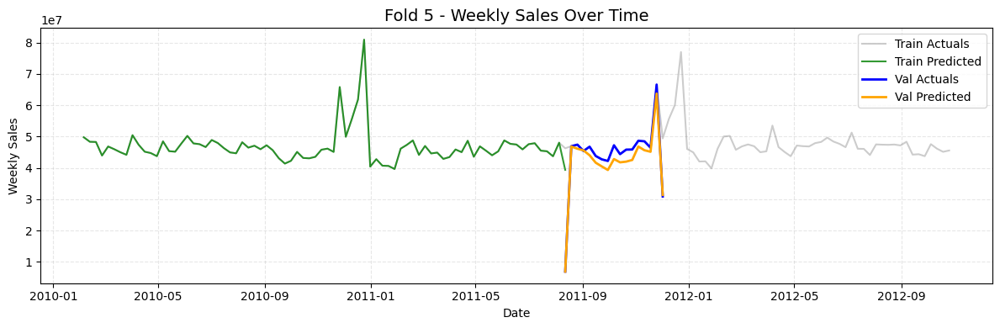


Fold 6 Scores:
Train RMSE: 2405.05 | Train WMAE: 1481.44
Valid RMSE: 5846.31 | Valid WMAE: 2914.18


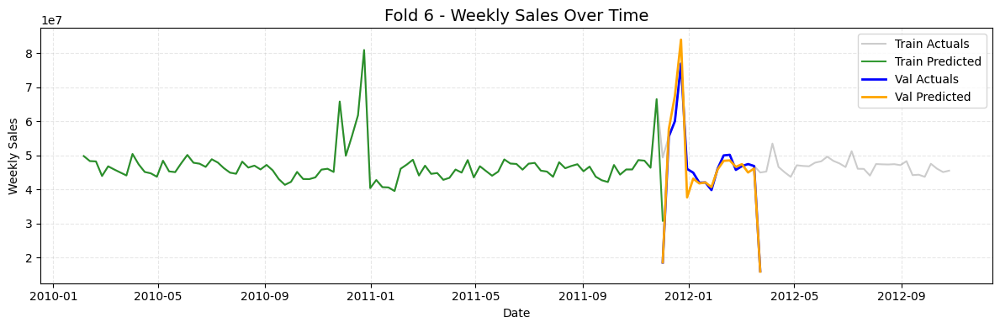


Fold 7 Scores:
Train RMSE: 2453.30 | Train WMAE: 1477.25
Valid RMSE: 4199.16 | Valid WMAE: 2074.14


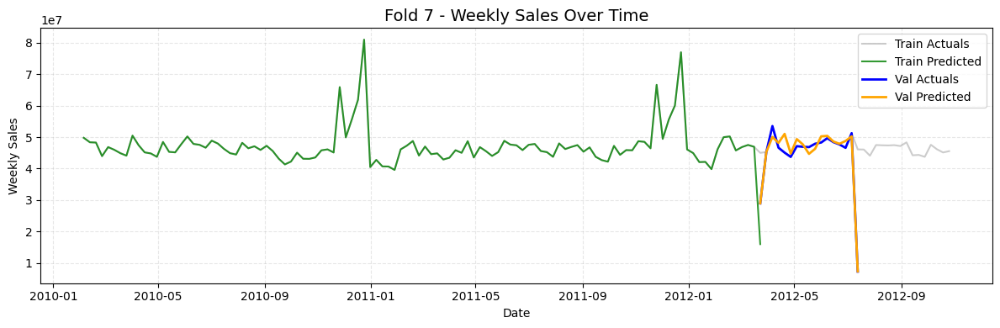


Fold 8 Scores:
Train RMSE: 2450.09 | Train WMAE: 1479.50
Valid RMSE: 3423.64 | Valid WMAE: 1785.18


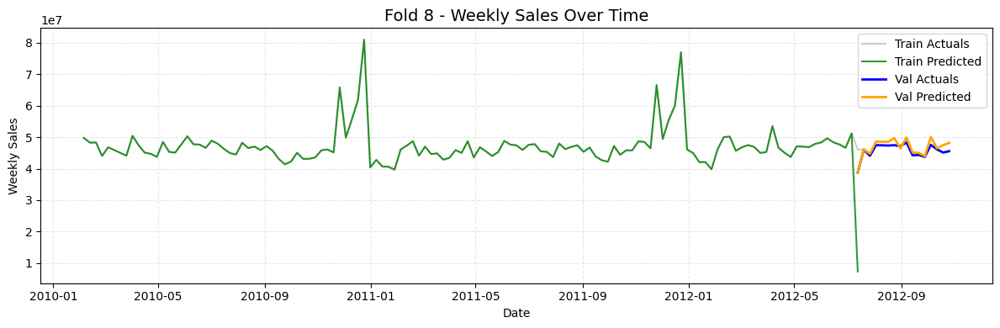


Mean Train RMSE: 2397.00
Mean Train WMAE: 1468.93
Mean Valid RMSE: 4811.93
Mean Valid WMAE: 2408.10


In [8]:
from sklearn.pipeline import Pipeline
from xgboost import XGBRegressor

preprocessor = Preprocessor()
feature_selection = FeatureSelector(columns_to_drop=['IsHoliday','Date'])
feature_engineer = FeatureEngineer()
model = XGBRegressor(
    n_estimators=400,
    max_depth=7,
    reg_alpha=0.1,
    reg_lambda=1.0,
    n_jobs=-1,
    random_state=42
)

pipeline = Pipeline([
    ('feature_engineer', feature_engineer),
    ('preprocessor', preprocessor),
    ('feature selection', feature_selection),
    ('model', model)
])

cross_validation(pipeline, X, y, df)


Fold 5 Scores:
Train RMSE: 15689.38 | Train WMAE: 10200.26
Valid RMSE: 12015.30 | Valid WMAE: 7746.47


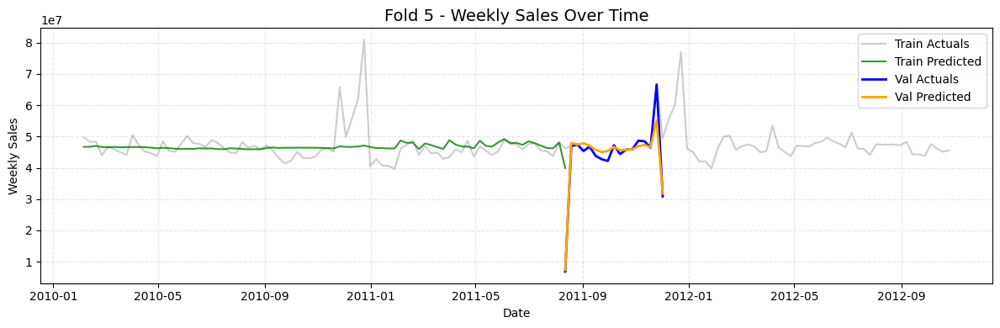


Fold 6 Scores:
Train RMSE: 15175.40 | Train WMAE: 9666.10
Valid RMSE: 11091.32 | Valid WMAE: 6915.17


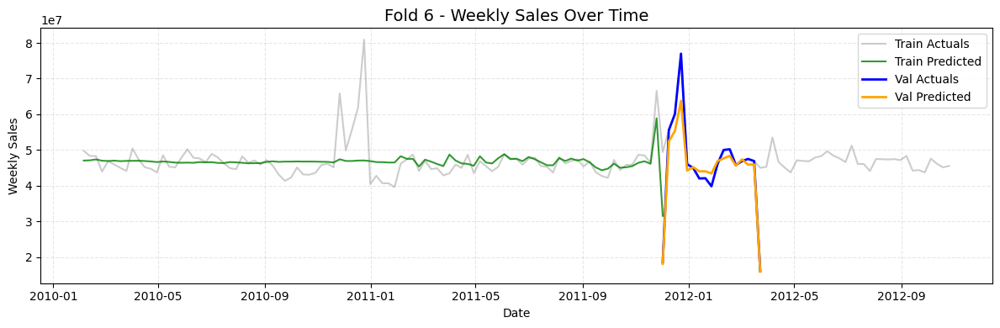


Fold 7 Scores:
Train RMSE: 14714.71 | Train WMAE: 9217.36
Valid RMSE: 9468.08 | Valid WMAE: 6466.67


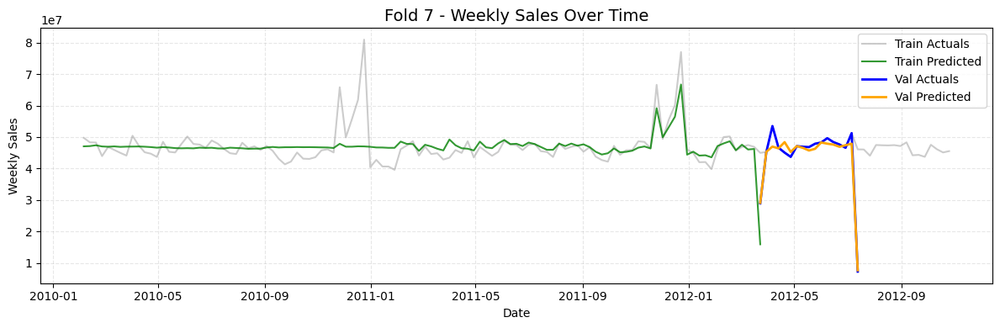


Fold 8 Scores:
Train RMSE: 14178.93 | Train WMAE: 8923.58
Valid RMSE: 8783.31 | Valid WMAE: 6155.71


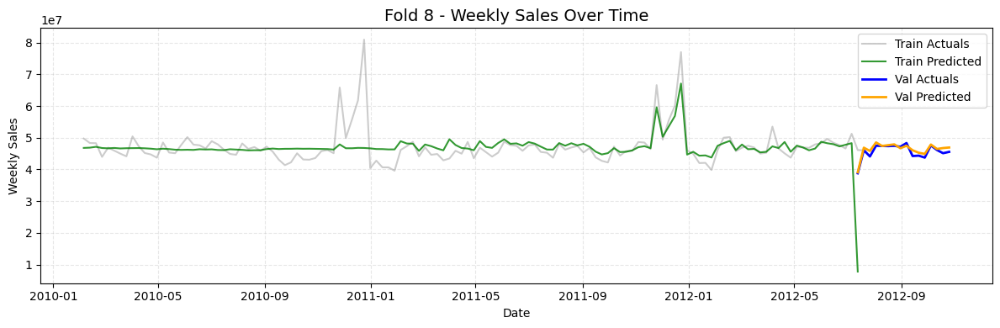


Mean Train RMSE: 14939.60
Mean Train WMAE: 9501.82
Mean Valid RMSE: 10339.50
Mean Valid WMAE: 6821.01

Fold 5 Scores:
Train RMSE: 14021.52 | Train WMAE: 9149.84
Valid RMSE: 11749.82 | Valid WMAE: 7251.09


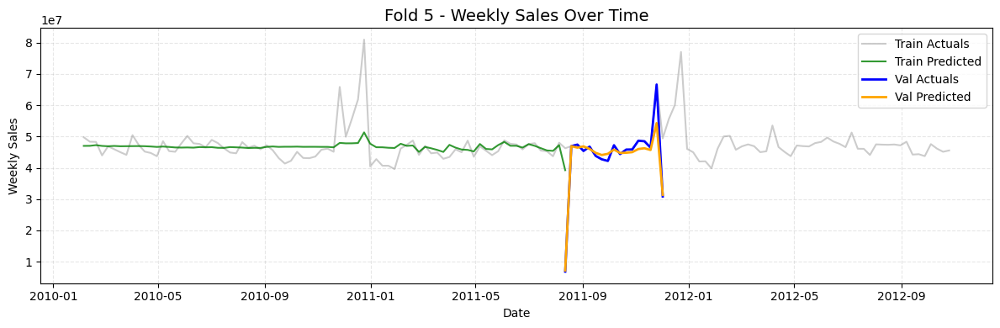


Fold 6 Scores:
Train RMSE: 13944.43 | Train WMAE: 8848.37
Valid RMSE: 11024.67 | Valid WMAE: 6577.19


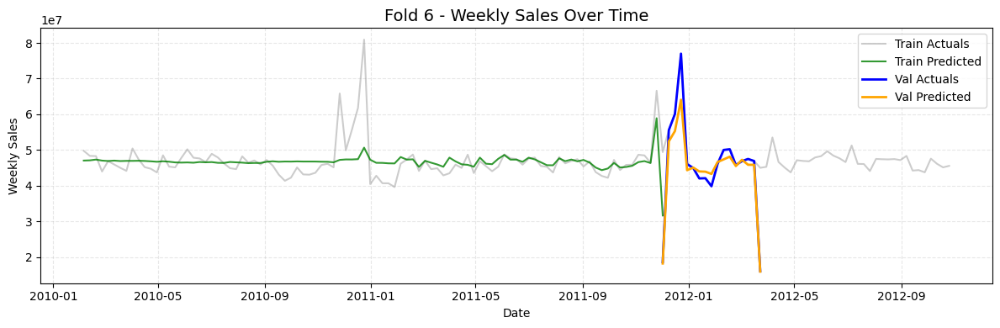


Fold 7 Scores:
Train RMSE: 13694.56 | Train WMAE: 8568.83
Valid RMSE: 9194.43 | Valid WMAE: 6255.19


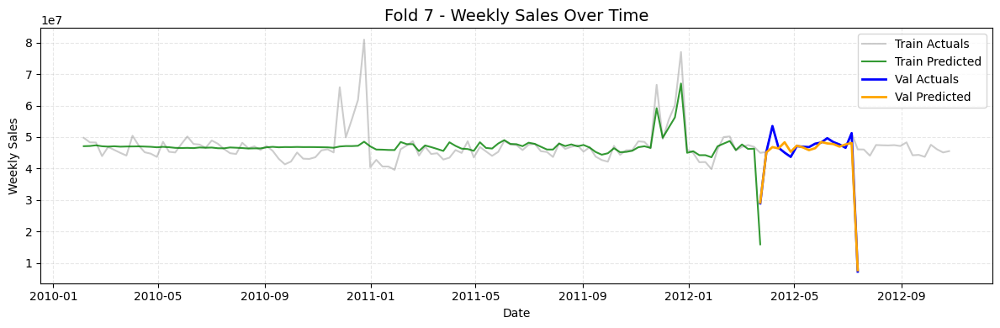


Fold 8 Scores:
Train RMSE: 13263.08 | Train WMAE: 8343.96
Valid RMSE: 8517.15 | Valid WMAE: 5962.34


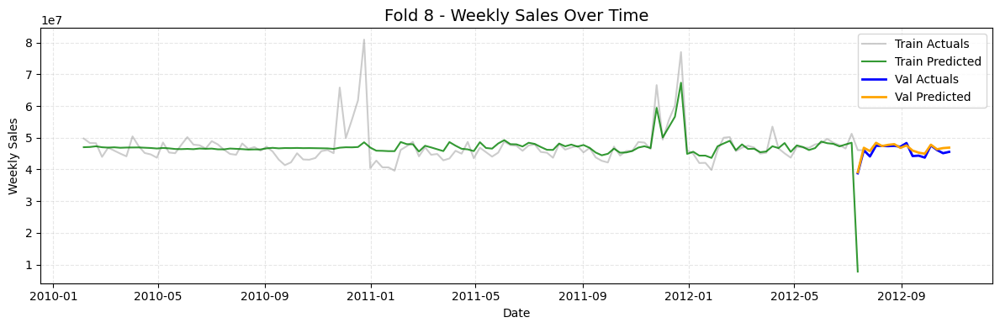


Mean Train RMSE: 13730.90
Mean Train WMAE: 8727.75
Mean Valid RMSE: 10121.52
Mean Valid WMAE: 6511.46

Fold 5 Scores:
Train RMSE: 9937.50 | Train WMAE: 5943.96
Valid RMSE: 6452.35 | Valid WMAE: 3135.22


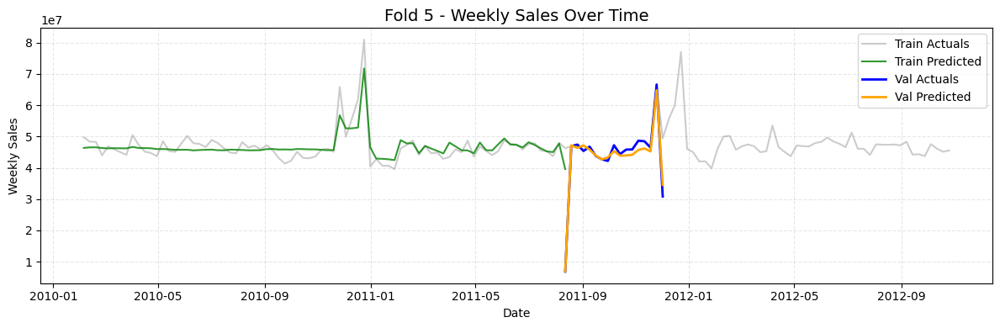


Fold 6 Scores:
Train RMSE: 9523.17 | Train WMAE: 5309.81
Valid RMSE: 5348.36 | Valid WMAE: 2782.61


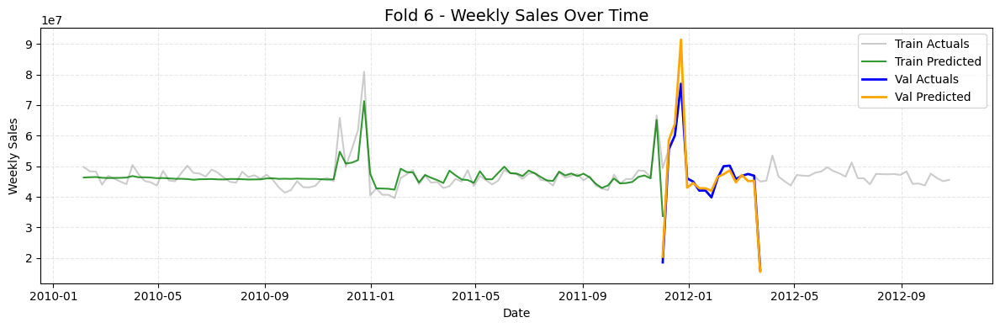


Fold 7 Scores:
Train RMSE: 9371.83 | Train WMAE: 5031.24
Valid RMSE: 4430.99 | Valid WMAE: 2327.52


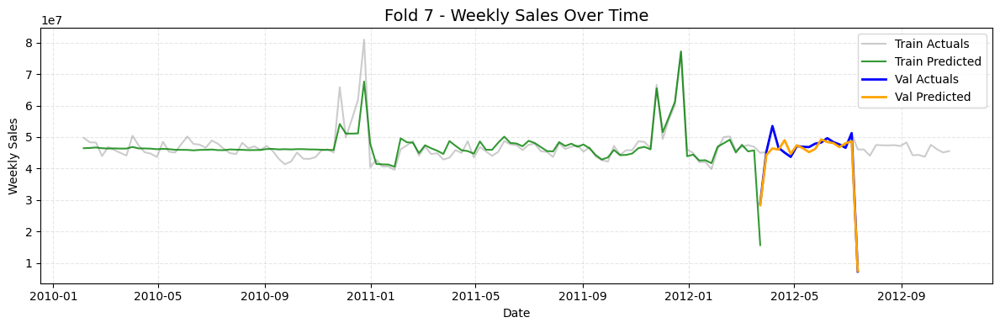


Fold 8 Scores:
Train RMSE: 8994.26 | Train WMAE: 4768.41
Valid RMSE: 3675.33 | Valid WMAE: 1979.32


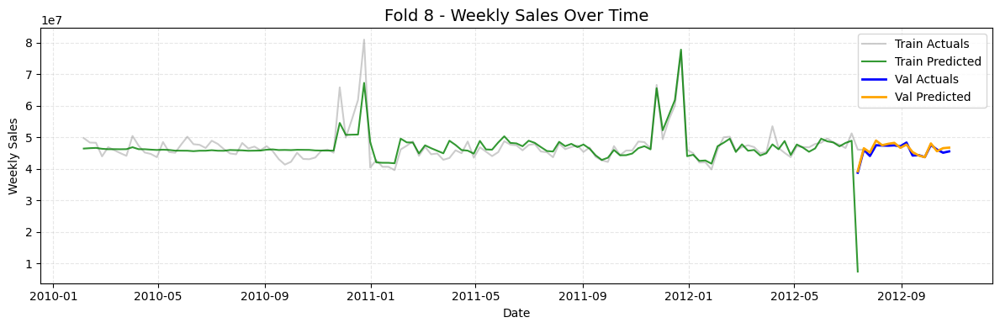


Mean Train RMSE: 9456.69
Mean Train WMAE: 5263.35
Mean Valid RMSE: 4976.76
Mean Valid WMAE: 2556.16

Fold 5 Scores:
Train RMSE: 7197.47 | Train WMAE: 4221.90
Valid RMSE: 5805.48 | Valid WMAE: 2597.37


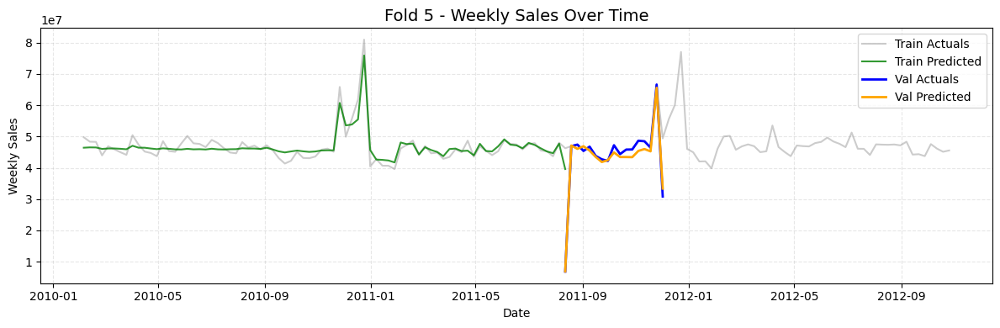


Fold 6 Scores:
Train RMSE: 7072.97 | Train WMAE: 3977.71
Valid RMSE: 5195.94 | Valid WMAE: 2569.31


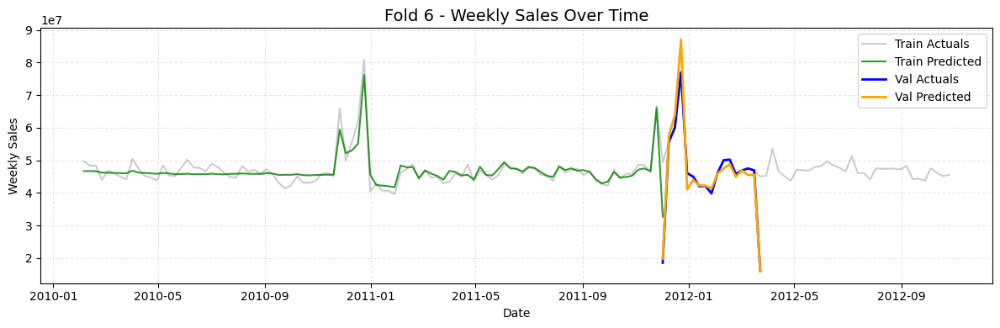


Fold 7 Scores:
Train RMSE: 6900.42 | Train WMAE: 3737.82
Valid RMSE: 4242.80 | Valid WMAE: 2088.53


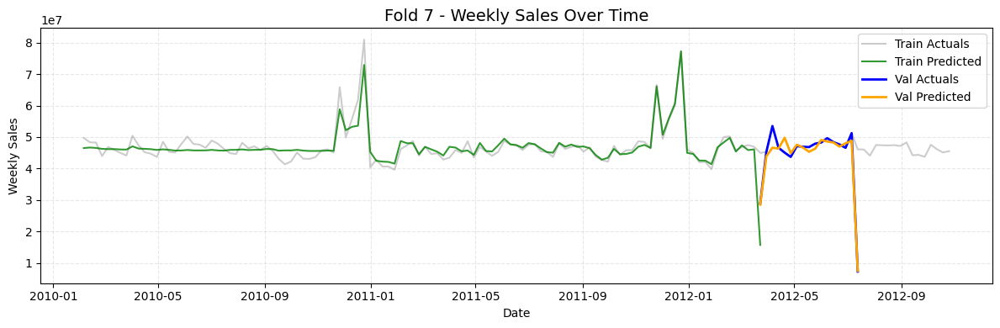


Fold 8 Scores:
Train RMSE: 6857.14 | Train WMAE: 3703.94
Valid RMSE: 3453.46 | Valid WMAE: 1779.50


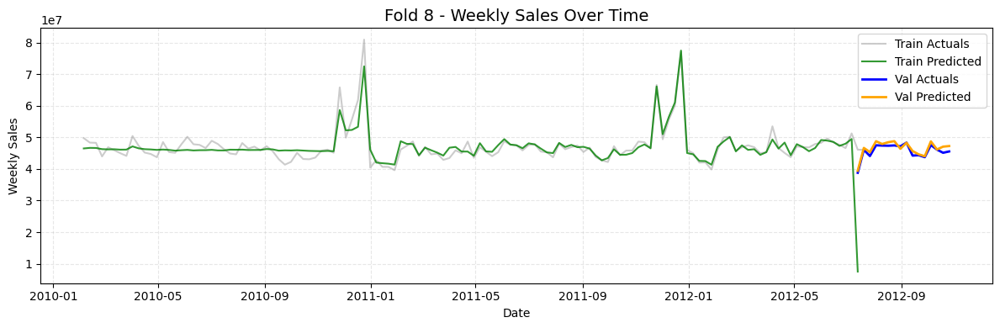


Mean Train RMSE: 7007.00
Mean Train WMAE: 3910.34
Mean Valid RMSE: 4674.42
Mean Valid WMAE: 2258.68

Fold 5 Scores:
Train RMSE: 7929.74 | Train WMAE: 4586.56
Valid RMSE: 5422.71 | Valid WMAE: 2978.62


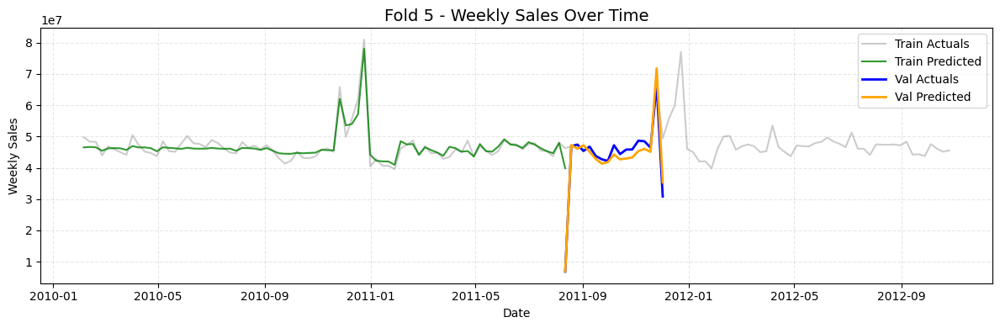


Fold 6 Scores:
Train RMSE: 7837.60 | Train WMAE: 4343.95
Valid RMSE: 5487.03 | Valid WMAE: 2897.11


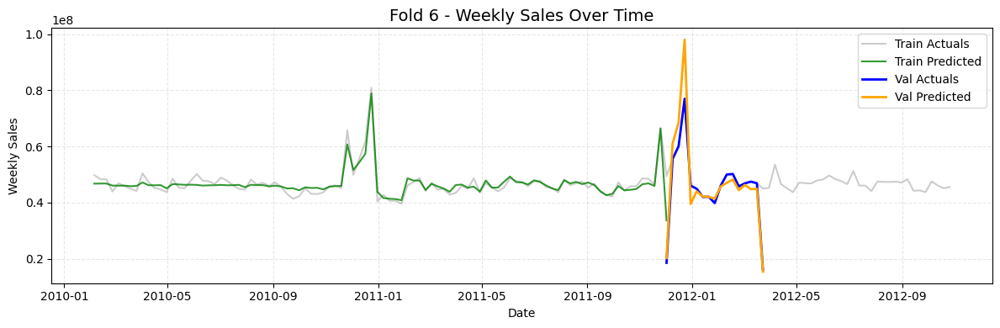


Fold 7 Scores:
Train RMSE: 7643.38 | Train WMAE: 4048.14
Valid RMSE: 4397.80 | Valid WMAE: 2274.28


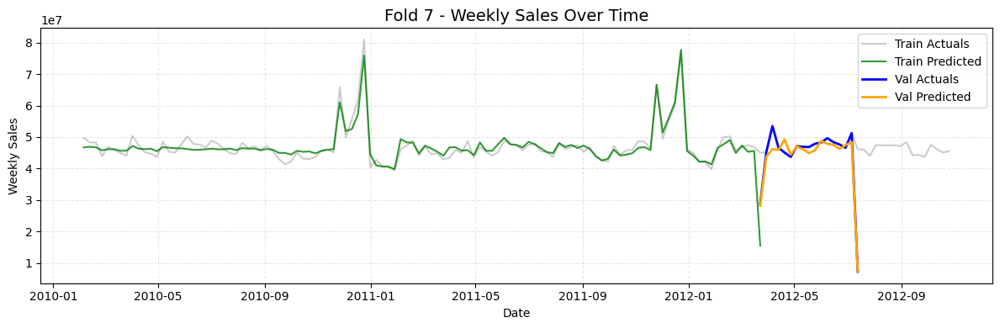


Fold 8 Scores:
Train RMSE: 7407.09 | Train WMAE: 3893.79
Valid RMSE: 3761.47 | Valid WMAE: 1977.43


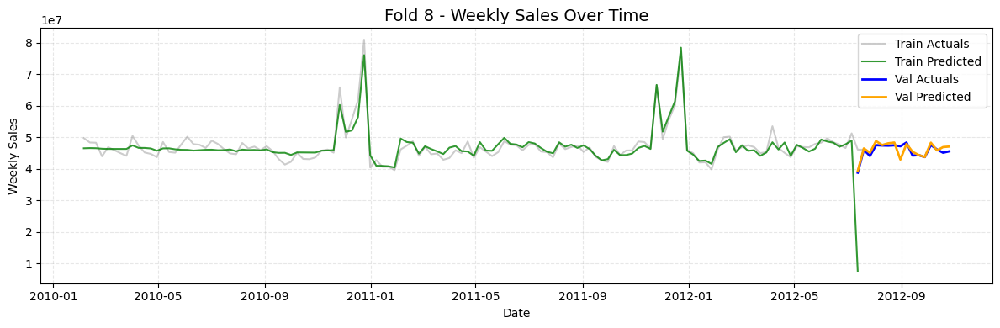


Mean Train RMSE: 7704.45
Mean Train WMAE: 4218.11
Mean Valid RMSE: 4767.25
Mean Valid WMAE: 2531.86

Fold 5 Scores:
Train RMSE: 5507.58 | Train WMAE: 3192.92
Valid RMSE: 5223.36 | Valid WMAE: 2663.45


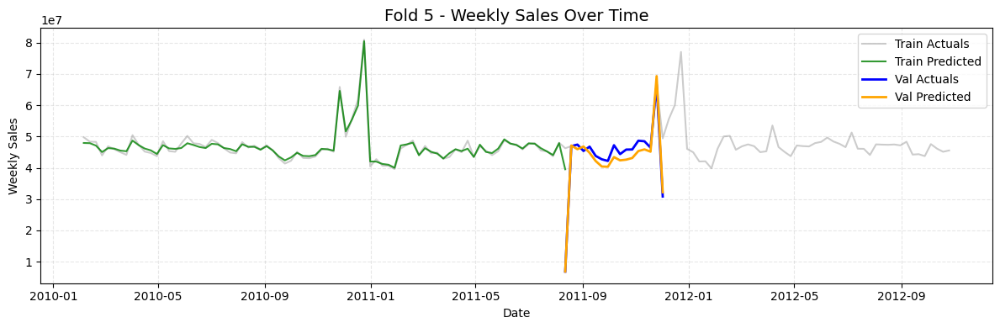


Fold 6 Scores:
Train RMSE: 5398.75 | Train WMAE: 3012.43
Valid RMSE: 5341.62 | Valid WMAE: 2612.34


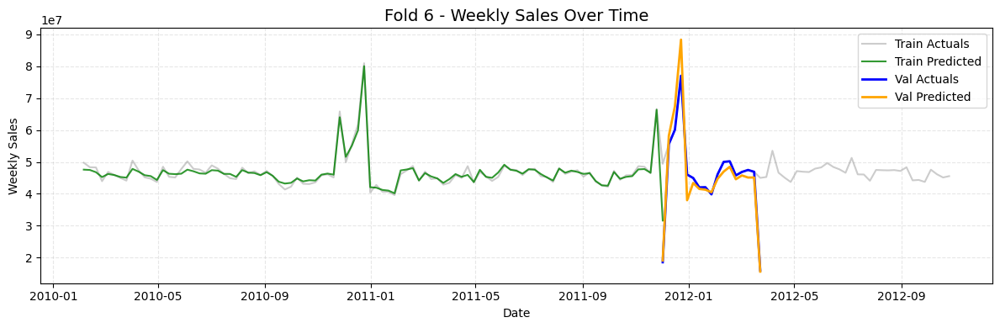


Fold 7 Scores:
Train RMSE: 5320.07 | Train WMAE: 2875.29
Valid RMSE: 4461.70 | Valid WMAE: 2051.50


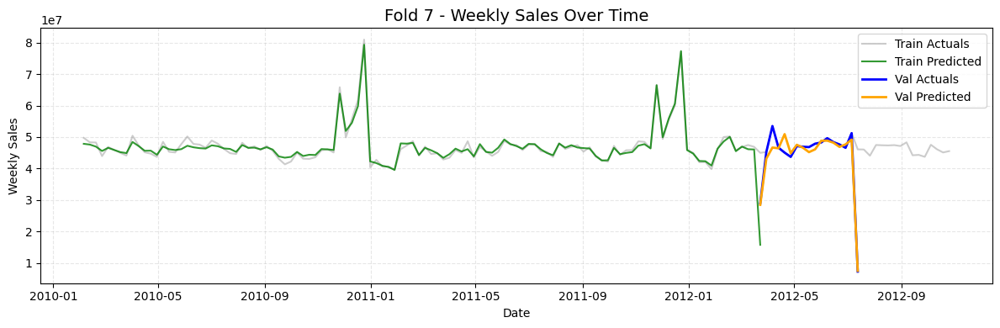


Fold 8 Scores:
Train RMSE: 5279.72 | Train WMAE: 2845.67
Valid RMSE: 3459.07 | Valid WMAE: 1763.12


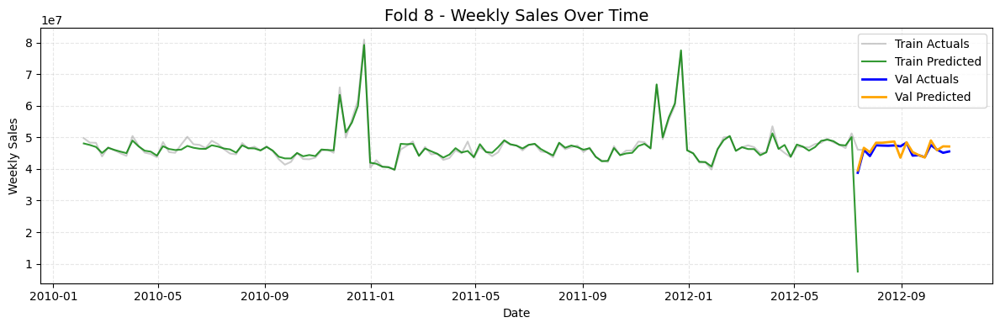


Mean Train RMSE: 5376.53
Mean Train WMAE: 2981.58
Mean Valid RMSE: 4621.44
Mean Valid WMAE: 2272.60

Fold 5 Scores:
Train RMSE: 15691.34 | Train WMAE: 10201.28
Valid RMSE: 11916.52 | Valid WMAE: 7720.32


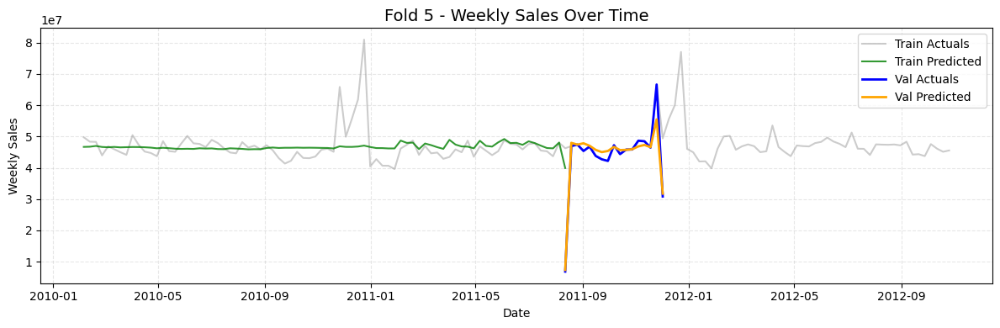


Fold 6 Scores:
Train RMSE: 15222.51 | Train WMAE: 9685.93
Valid RMSE: 10813.26 | Valid WMAE: 6883.85


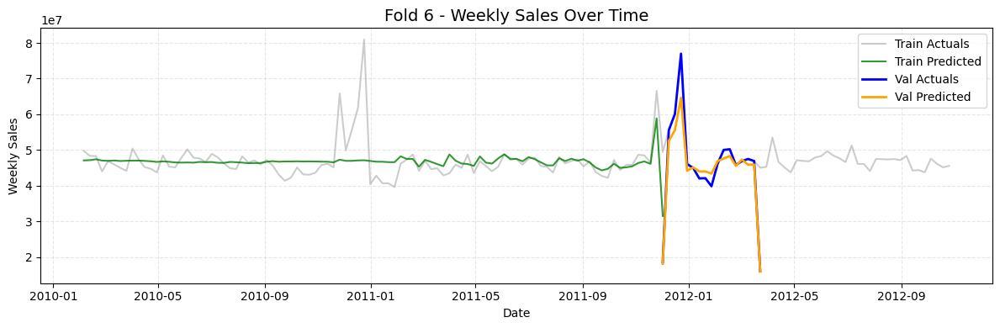


Fold 7 Scores:
Train RMSE: 14714.71 | Train WMAE: 9217.36
Valid RMSE: 9468.08 | Valid WMAE: 6466.67


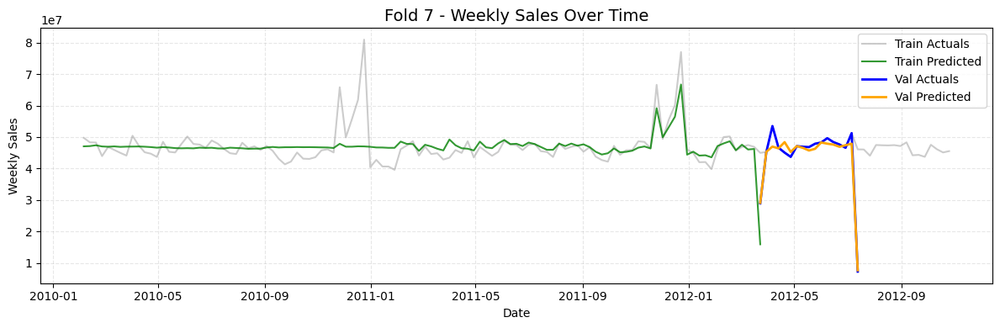


Fold 8 Scores:
Train RMSE: 14178.93 | Train WMAE: 8923.58
Valid RMSE: 8783.31 | Valid WMAE: 6155.71


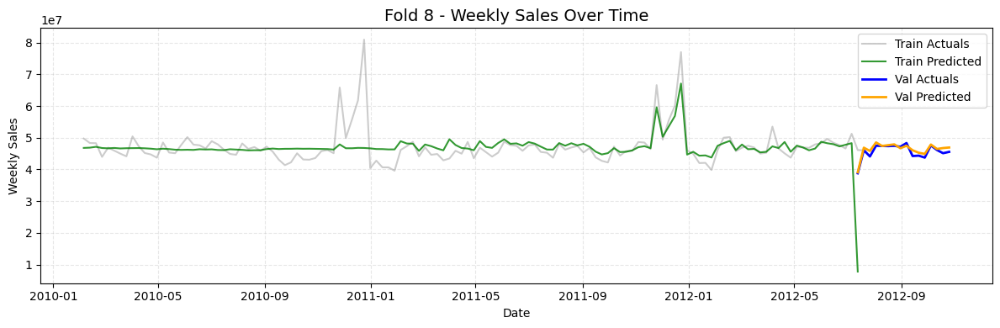


Mean Train RMSE: 14951.87
Mean Train WMAE: 9507.04
Mean Valid RMSE: 10245.29
Mean Valid WMAE: 6806.64

Fold 5 Scores:
Train RMSE: 14034.13 | Train WMAE: 9156.67
Valid RMSE: 11703.60 | Valid WMAE: 7236.06


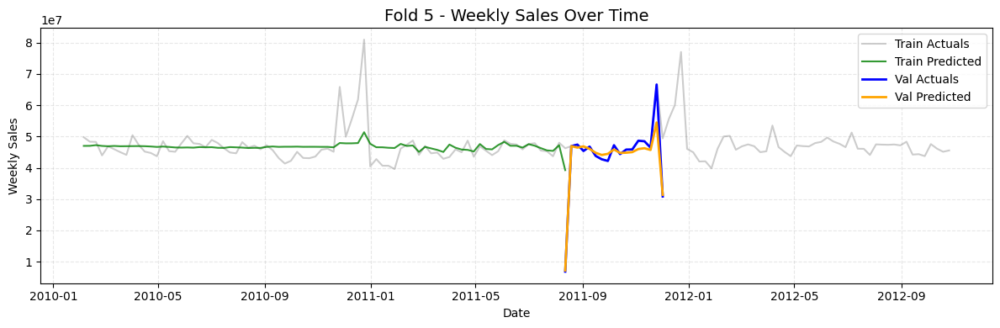


Fold 6 Scores:
Train RMSE: 13965.81 | Train WMAE: 8860.39
Valid RMSE: 10760.32 | Valid WMAE: 6556.40


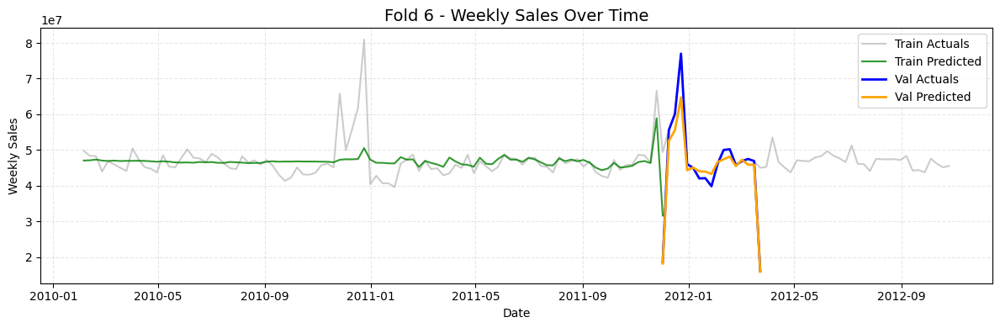


Fold 7 Scores:
Train RMSE: 13711.85 | Train WMAE: 8577.34
Valid RMSE: 9200.37 | Valid WMAE: 6256.02


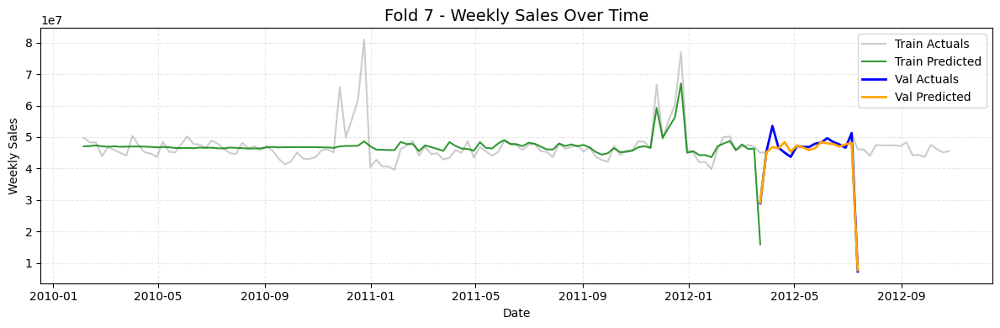


Fold 8 Scores:
Train RMSE: 13263.09 | Train WMAE: 8344.59
Valid RMSE: 8515.14 | Valid WMAE: 5965.31


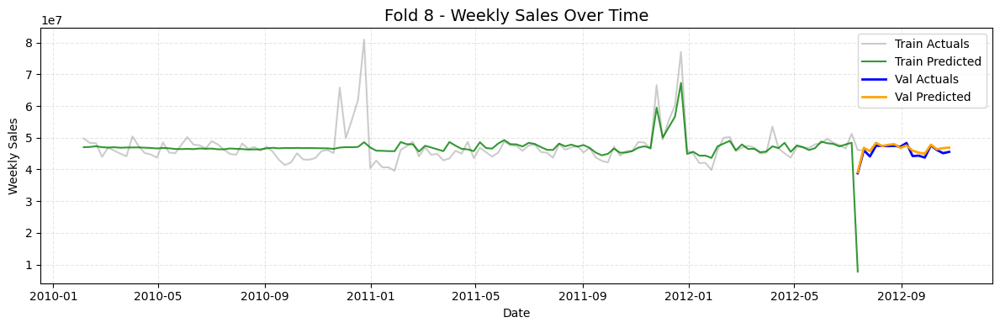


Mean Train RMSE: 13743.72
Mean Train WMAE: 8734.75
Mean Valid RMSE: 10044.86
Mean Valid WMAE: 6503.45

Fold 5 Scores:
Train RMSE: 9829.44 | Train WMAE: 5871.92
Valid RMSE: 6144.80 | Valid WMAE: 3099.08


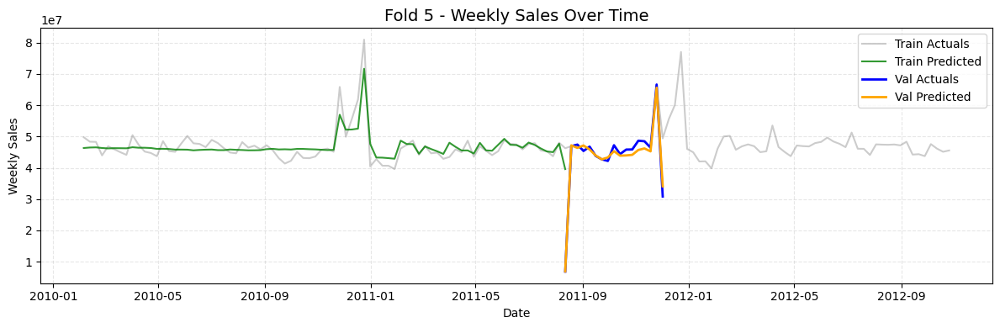


Fold 6 Scores:
Train RMSE: 9658.91 | Train WMAE: 5379.62
Valid RMSE: 5190.36 | Valid WMAE: 2769.52


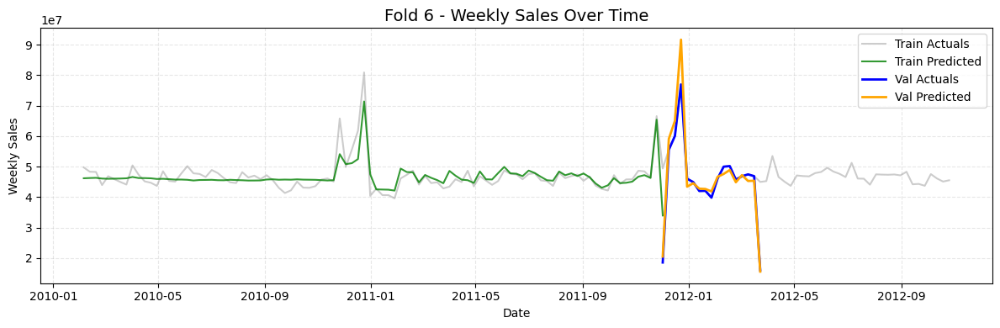


Fold 7 Scores:
Train RMSE: 9262.09 | Train WMAE: 4951.43
Valid RMSE: 4427.08 | Valid WMAE: 2309.97


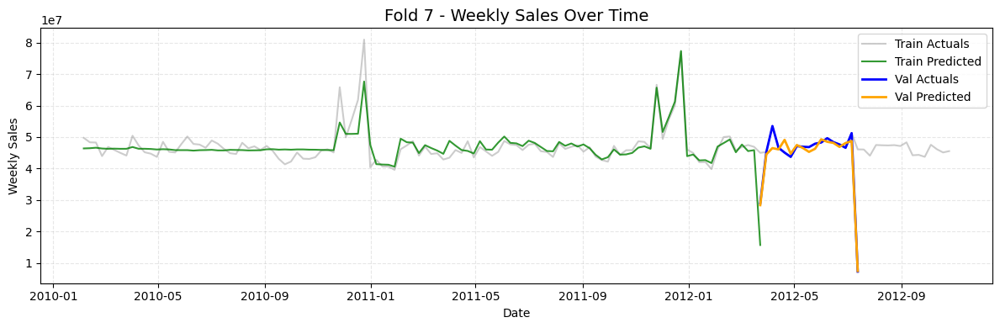


Fold 8 Scores:
Train RMSE: 9063.00 | Train WMAE: 4792.41
Valid RMSE: 3659.04 | Valid WMAE: 1977.10


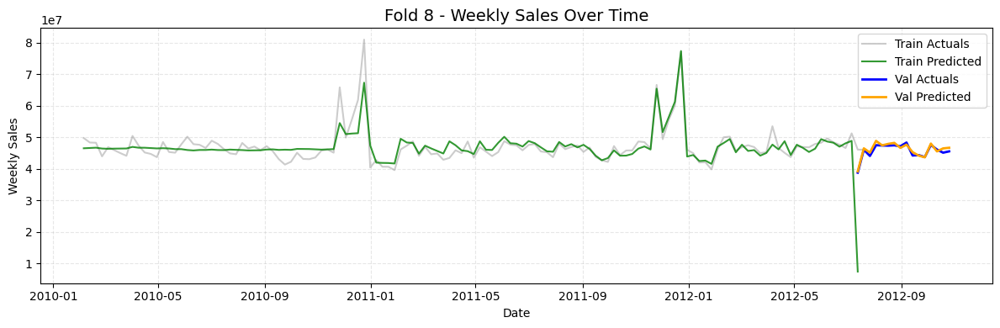


Mean Train RMSE: 9453.36
Mean Train WMAE: 5248.85
Mean Valid RMSE: 4855.32
Mean Valid WMAE: 2538.92

Fold 5 Scores:
Train RMSE: 7213.81 | Train WMAE: 4270.03
Valid RMSE: 5920.05 | Valid WMAE: 2634.78


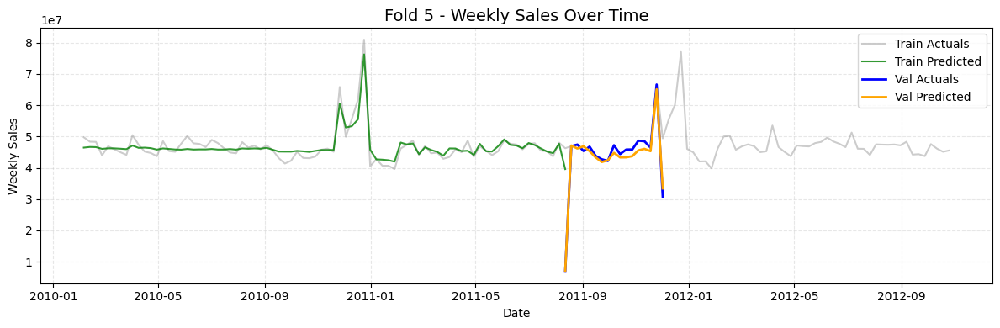


Fold 6 Scores:
Train RMSE: 7108.50 | Train WMAE: 3972.36
Valid RMSE: 5002.23 | Valid WMAE: 2573.75


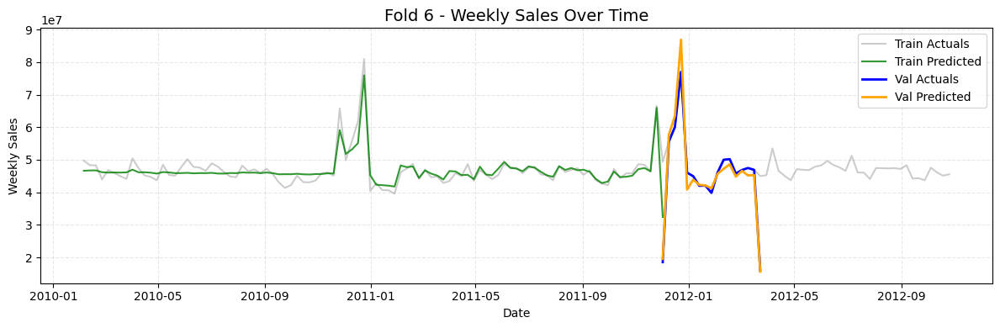


Fold 7 Scores:
Train RMSE: 6980.40 | Train WMAE: 3761.18
Valid RMSE: 4262.13 | Valid WMAE: 2107.19


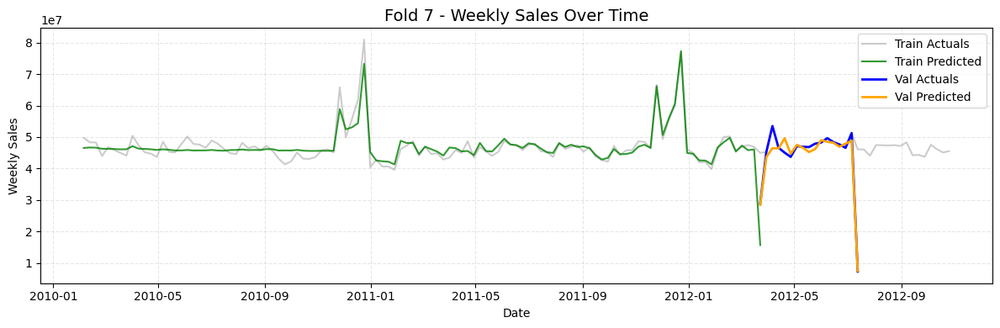


Fold 8 Scores:
Train RMSE: 6929.52 | Train WMAE: 3751.81
Valid RMSE: 3450.26 | Valid WMAE: 1779.23


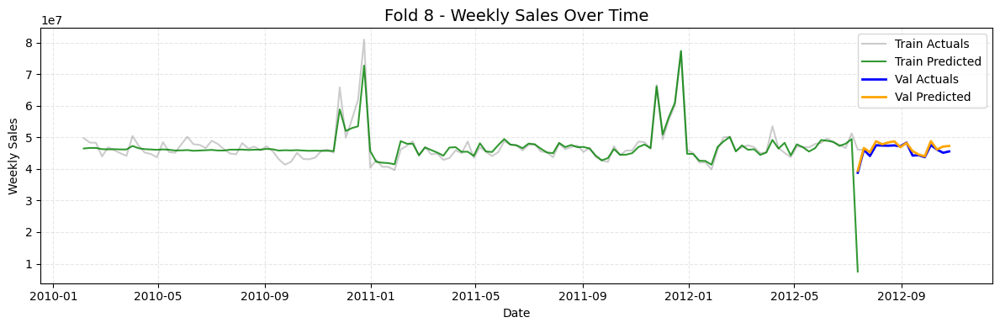


Mean Train RMSE: 7058.06
Mean Train WMAE: 3938.85
Mean Valid RMSE: 4658.67
Mean Valid WMAE: 2273.74

Fold 5 Scores:
Train RMSE: 8013.04 | Train WMAE: 4643.95
Valid RMSE: 5262.61 | Valid WMAE: 2916.19


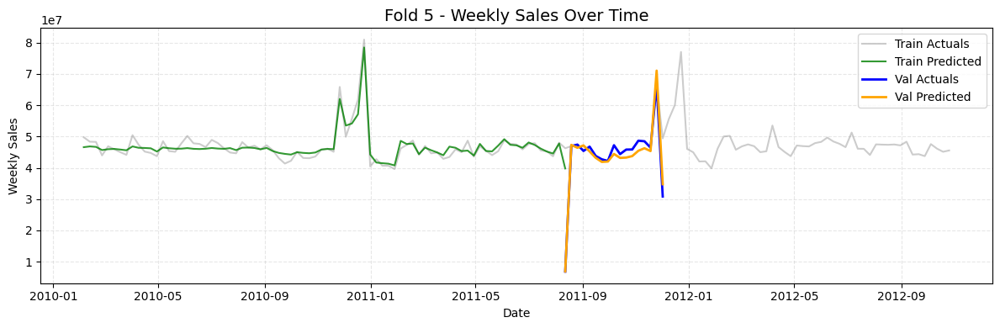


Fold 6 Scores:
Train RMSE: 7776.10 | Train WMAE: 4291.49
Valid RMSE: 5307.17 | Valid WMAE: 2877.93


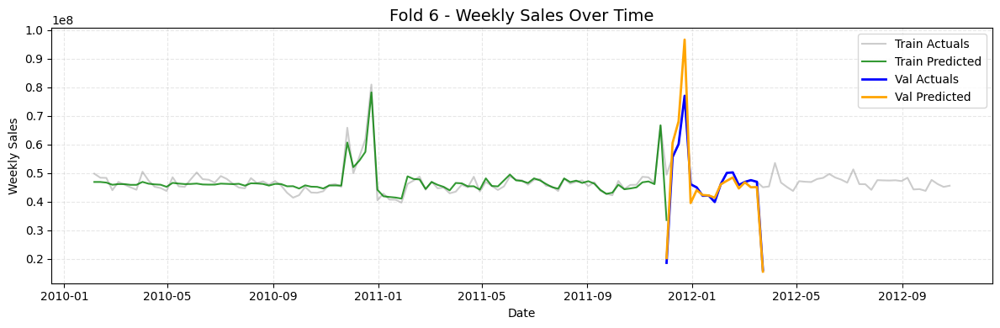


Fold 7 Scores:
Train RMSE: 7652.94 | Train WMAE: 4038.89
Valid RMSE: 4369.16 | Valid WMAE: 2256.26


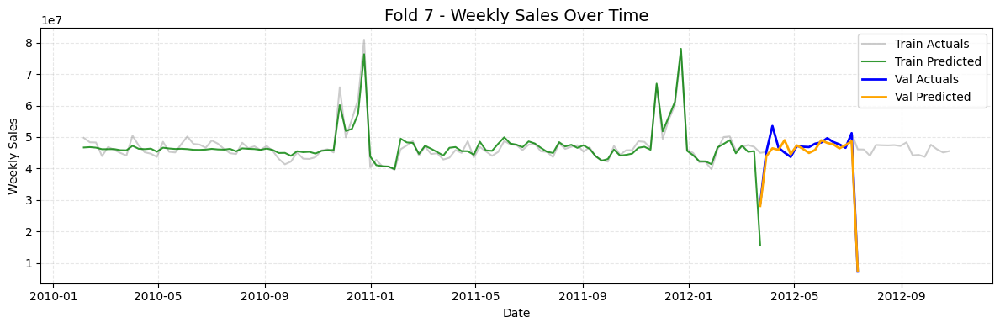


Fold 8 Scores:
Train RMSE: 7309.34 | Train WMAE: 3846.94
Valid RMSE: 3662.18 | Valid WMAE: 1932.97


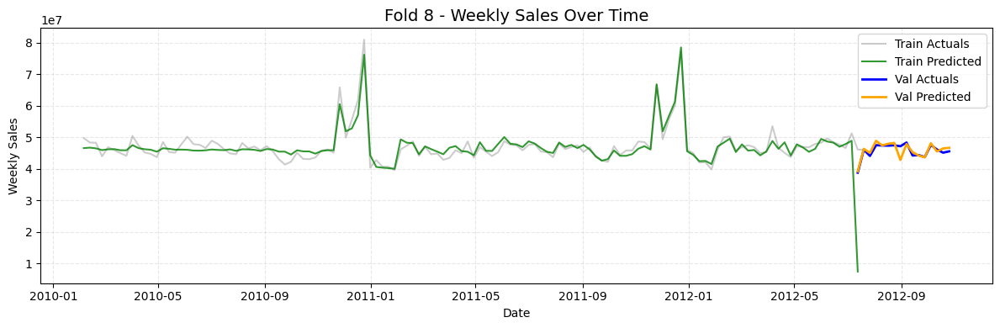


Mean Train RMSE: 7687.85
Mean Train WMAE: 4205.32
Mean Valid RMSE: 4650.28
Mean Valid WMAE: 2495.84

Fold 5 Scores:
Train RMSE: 5546.28 | Train WMAE: 3228.61
Valid RMSE: 5128.12 | Valid WMAE: 2643.00


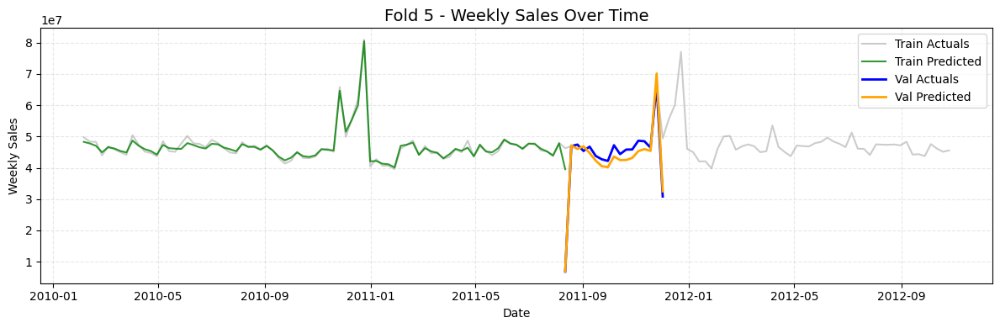


Fold 6 Scores:
Train RMSE: 5526.97 | Train WMAE: 3078.25
Valid RMSE: 4949.49 | Valid WMAE: 2609.39


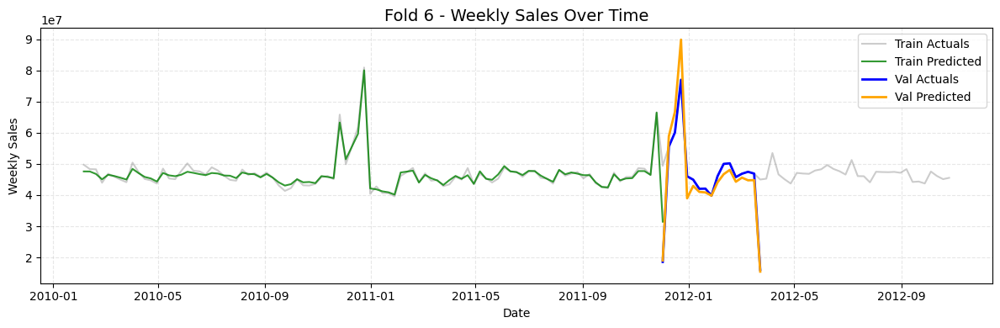


Fold 7 Scores:
Train RMSE: 5348.85 | Train WMAE: 2879.88
Valid RMSE: 4352.68 | Valid WMAE: 2055.87


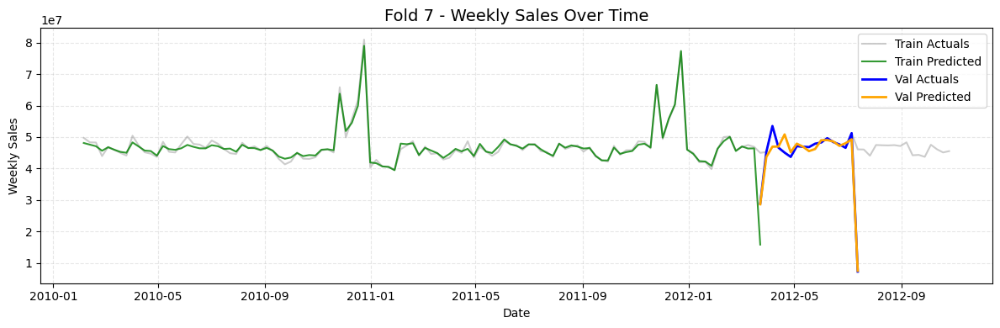


Fold 8 Scores:
Train RMSE: 5340.21 | Train WMAE: 2856.15
Valid RMSE: 3454.02 | Valid WMAE: 1781.17


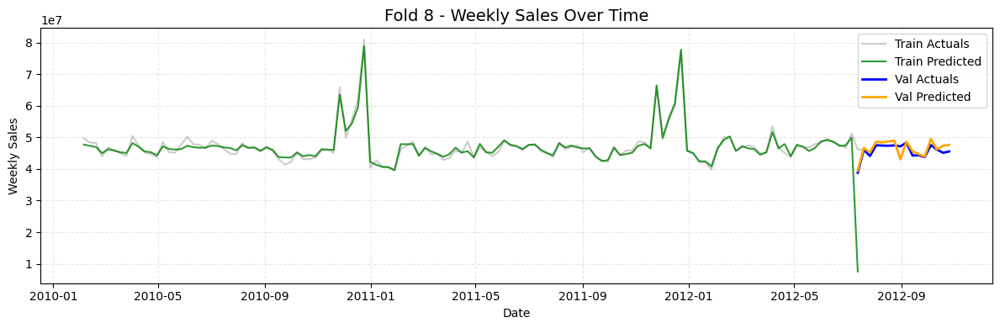


Mean Train RMSE: 5440.58
Mean Train WMAE: 3010.72
Mean Valid RMSE: 4471.08
Mean Valid WMAE: 2272.36

Fold 5 Scores:
Train RMSE: 15696.94 | Train WMAE: 10202.19
Valid RMSE: 11929.76 | Valid WMAE: 7721.71


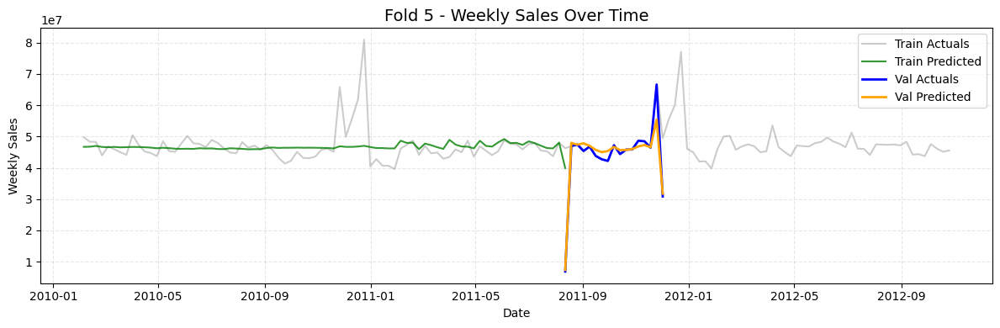


Fold 6 Scores:
Train RMSE: 15213.67 | Train WMAE: 9683.25
Valid RMSE: 10806.31 | Valid WMAE: 6887.23


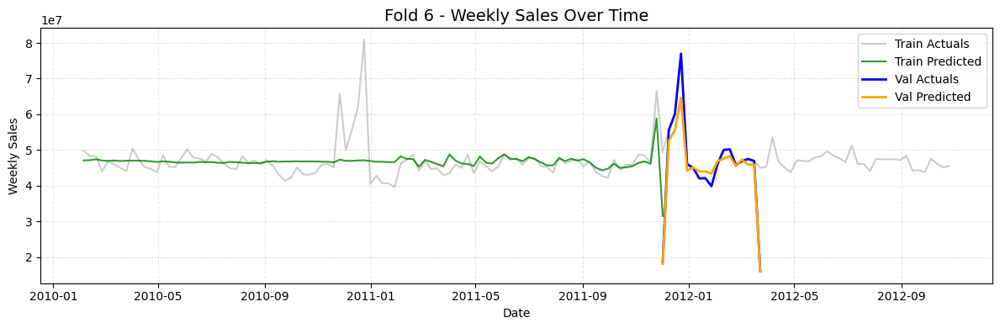


Fold 7 Scores:
Train RMSE: 14719.67 | Train WMAE: 9219.48
Valid RMSE: 9466.11 | Valid WMAE: 6466.46


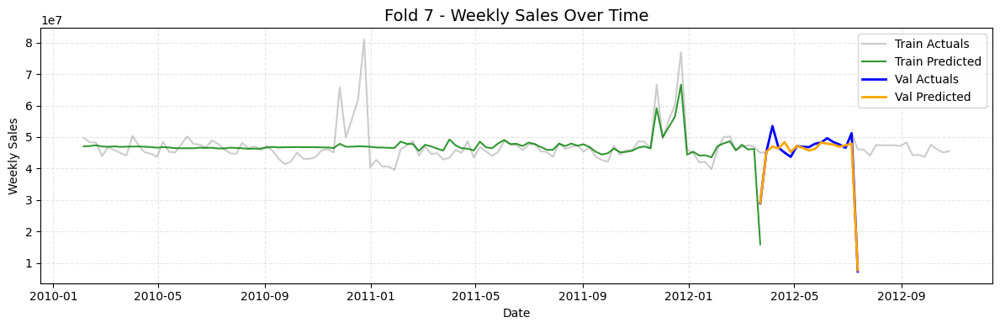


Fold 8 Scores:
Train RMSE: 14193.88 | Train WMAE: 8929.82
Valid RMSE: 8781.95 | Valid WMAE: 6153.22


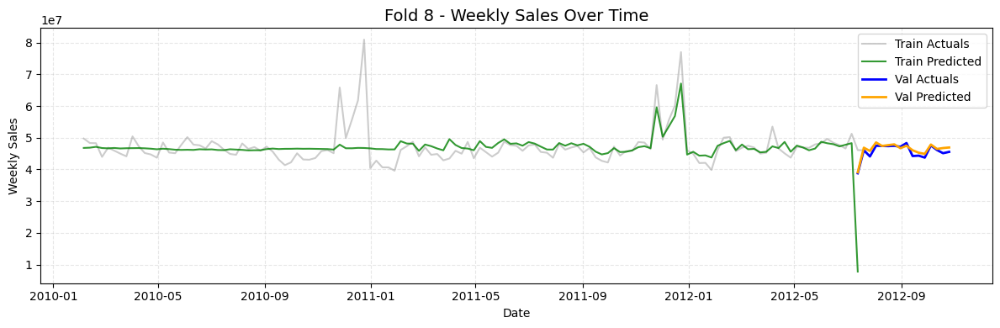


Mean Train RMSE: 14956.04
Mean Train WMAE: 9508.69
Mean Valid RMSE: 10246.03
Mean Valid WMAE: 6807.15

Fold 5 Scores:
Train RMSE: 14016.94 | Train WMAE: 9146.90
Valid RMSE: 11622.67 | Valid WMAE: 7217.72


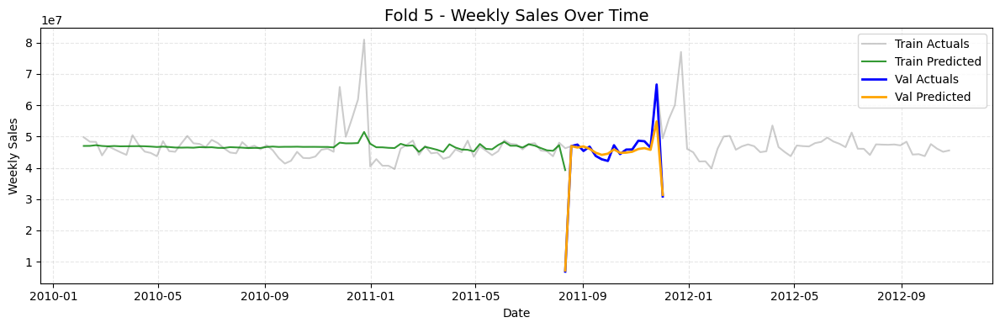


Fold 6 Scores:
Train RMSE: 13950.30 | Train WMAE: 8846.84
Valid RMSE: 10481.60 | Valid WMAE: 6533.75


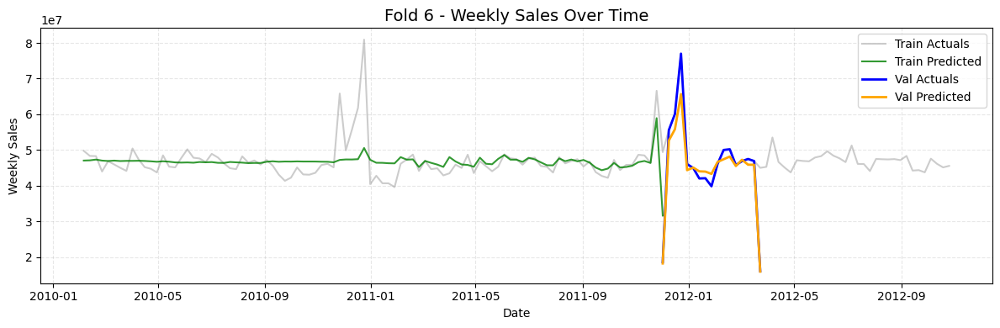


Fold 7 Scores:
Train RMSE: 13719.40 | Train WMAE: 8570.15
Valid RMSE: 9215.21 | Valid WMAE: 6260.02


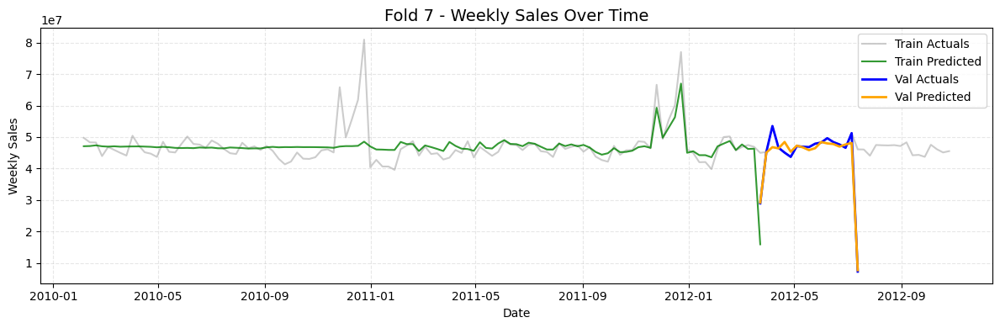


Fold 8 Scores:
Train RMSE: 13291.08 | Train WMAE: 8349.68
Valid RMSE: 8514.07 | Valid WMAE: 5962.11


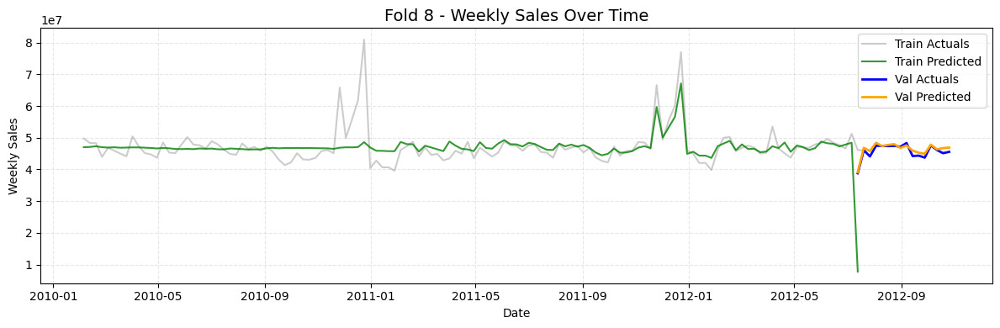


Mean Train RMSE: 13744.43
Mean Train WMAE: 8728.39
Mean Valid RMSE: 9958.39
Mean Valid WMAE: 6493.40

Fold 5 Scores:
Train RMSE: 9855.21 | Train WMAE: 5893.53
Valid RMSE: 6262.36 | Valid WMAE: 3057.70


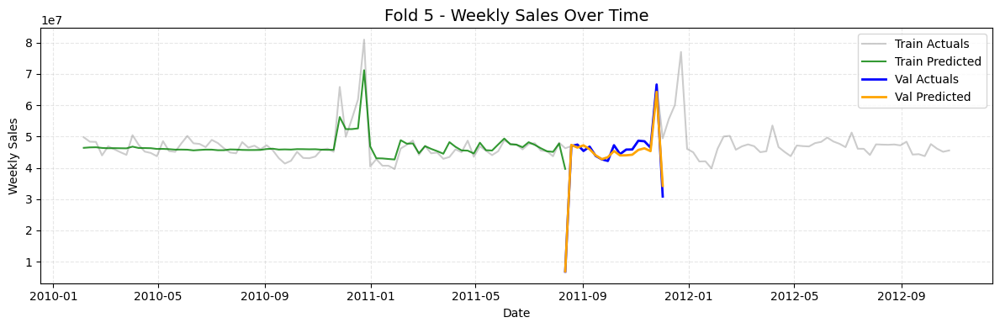


Fold 6 Scores:
Train RMSE: 9513.36 | Train WMAE: 5316.89
Valid RMSE: 5232.75 | Valid WMAE: 2851.37


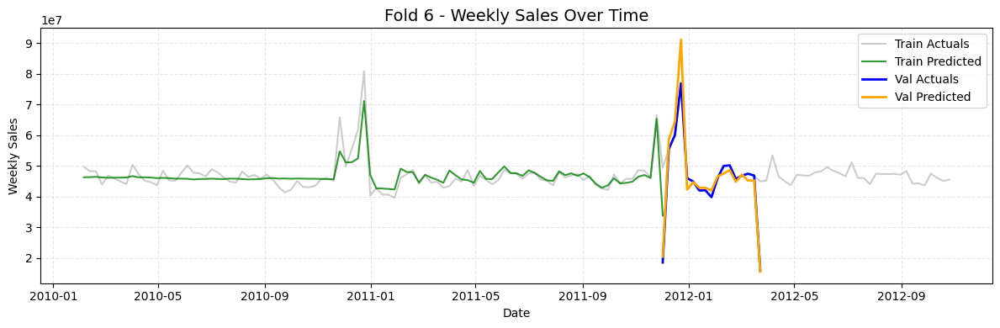


Fold 7 Scores:
Train RMSE: 9343.14 | Train WMAE: 4983.56
Valid RMSE: 4449.85 | Valid WMAE: 2320.76


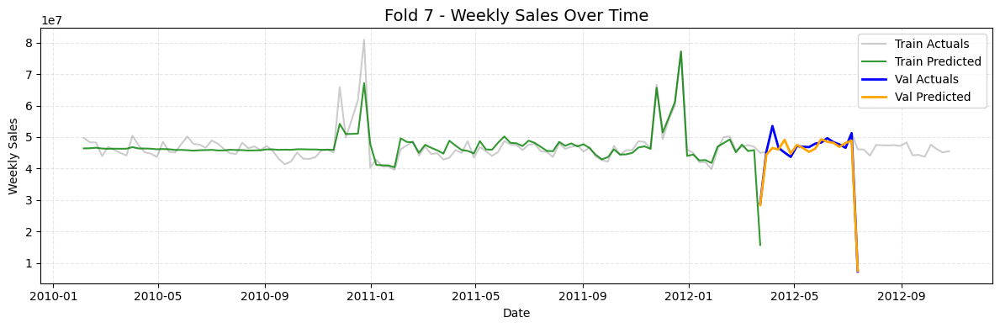


Fold 8 Scores:
Train RMSE: 9026.87 | Train WMAE: 4759.92
Valid RMSE: 3667.73 | Valid WMAE: 1976.42


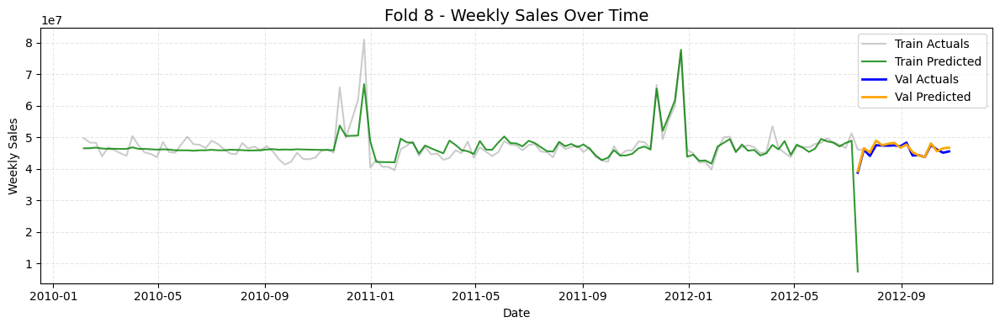


Mean Train RMSE: 9434.64
Mean Train WMAE: 5238.47
Mean Valid RMSE: 4903.17
Mean Valid WMAE: 2551.56

Fold 5 Scores:
Train RMSE: 7283.62 | Train WMAE: 4330.36
Valid RMSE: 5914.14 | Valid WMAE: 2669.23


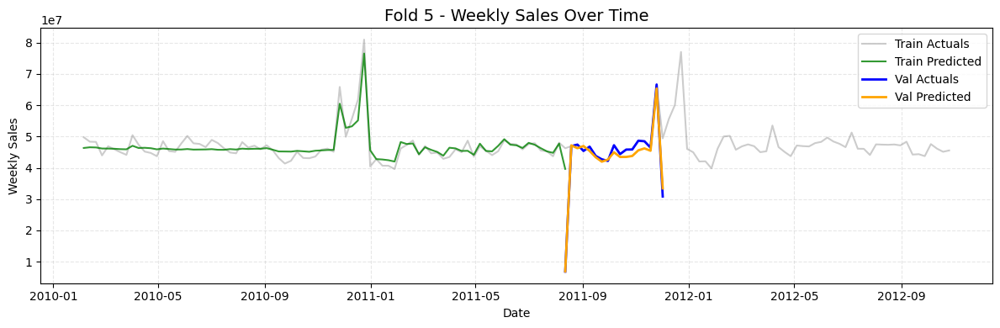


Fold 6 Scores:
Train RMSE: 7076.41 | Train WMAE: 3939.46
Valid RMSE: 5065.90 | Valid WMAE: 2556.20


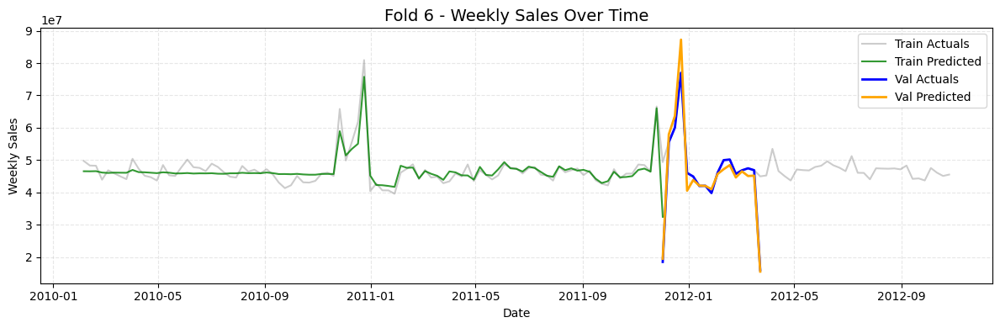


Fold 7 Scores:
Train RMSE: 7088.83 | Train WMAE: 3822.32
Valid RMSE: 4278.39 | Valid WMAE: 2103.25


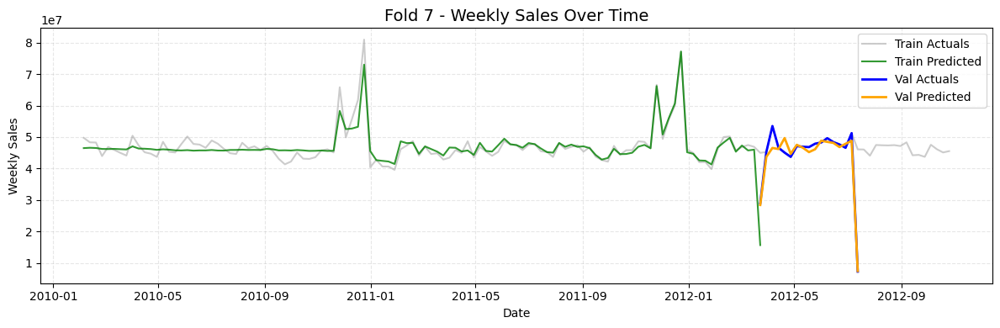


Fold 8 Scores:
Train RMSE: 6822.11 | Train WMAE: 3679.50
Valid RMSE: 3455.09 | Valid WMAE: 1775.55


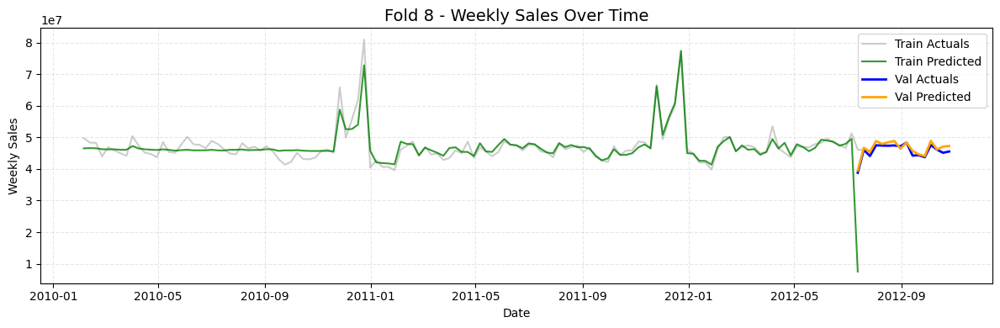


Mean Train RMSE: 7067.74
Mean Train WMAE: 3942.91
Mean Valid RMSE: 4678.38
Mean Valid WMAE: 2276.06

Fold 5 Scores:
Train RMSE: 8127.00 | Train WMAE: 4695.45
Valid RMSE: 5480.90 | Valid WMAE: 2996.14


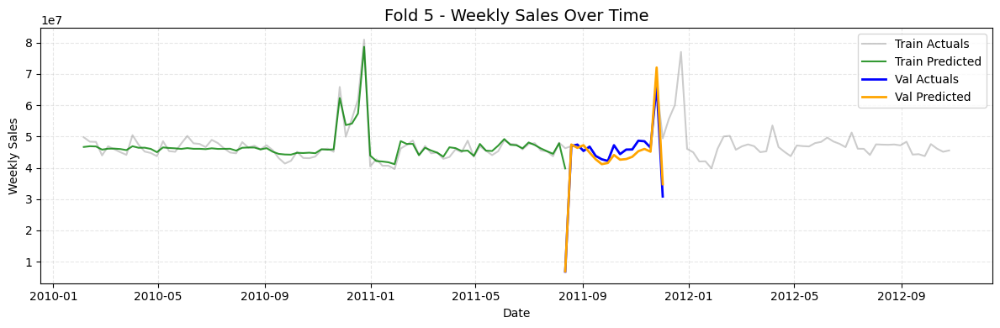


Fold 6 Scores:
Train RMSE: 7800.84 | Train WMAE: 4324.35
Valid RMSE: 5365.74 | Valid WMAE: 2867.30


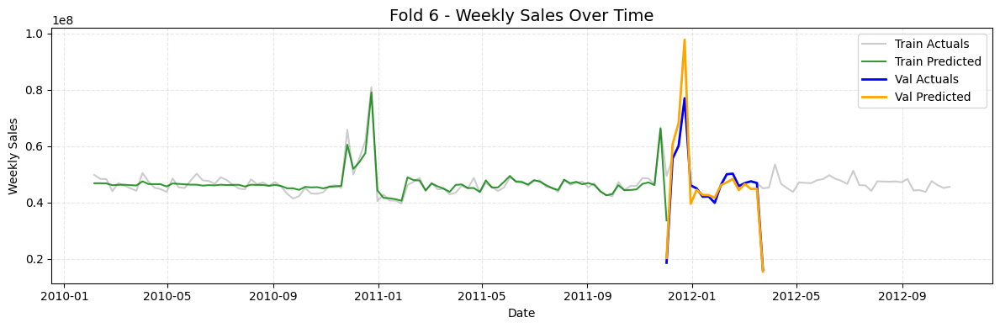


Fold 7 Scores:
Train RMSE: 7665.12 | Train WMAE: 4047.32
Valid RMSE: 4375.95 | Valid WMAE: 2271.04


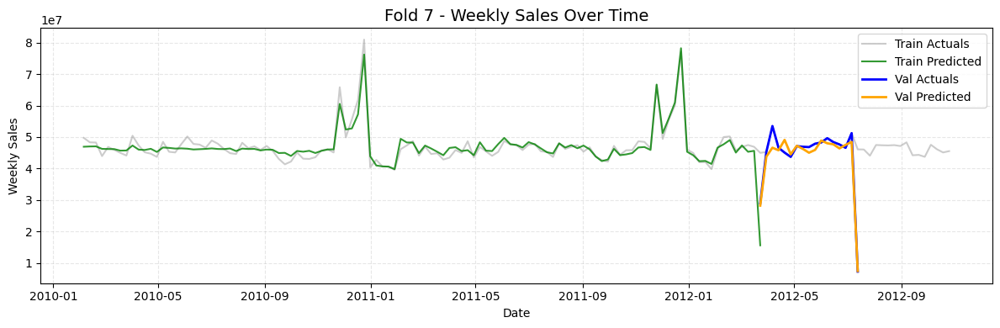


Fold 8 Scores:
Train RMSE: 7393.10 | Train WMAE: 3884.68
Valid RMSE: 3657.88 | Valid WMAE: 1939.28


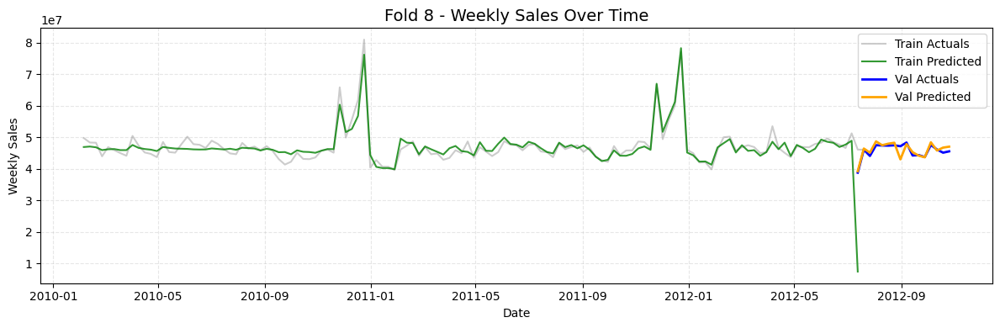


Mean Train RMSE: 7746.51
Mean Train WMAE: 4237.95
Mean Valid RMSE: 4720.12
Mean Valid WMAE: 2518.44

Fold 5 Scores:
Train RMSE: 5582.54 | Train WMAE: 3223.00
Valid RMSE: 5131.13 | Valid WMAE: 2567.58


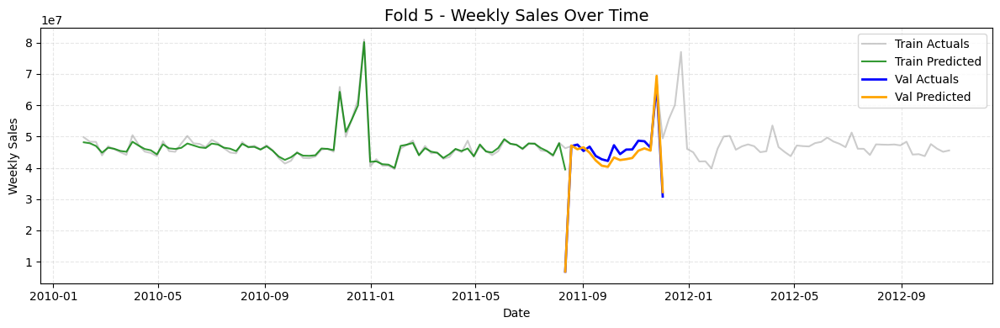


Fold 6 Scores:
Train RMSE: 5518.52 | Train WMAE: 3060.37
Valid RMSE: 5005.23 | Valid WMAE: 2624.60


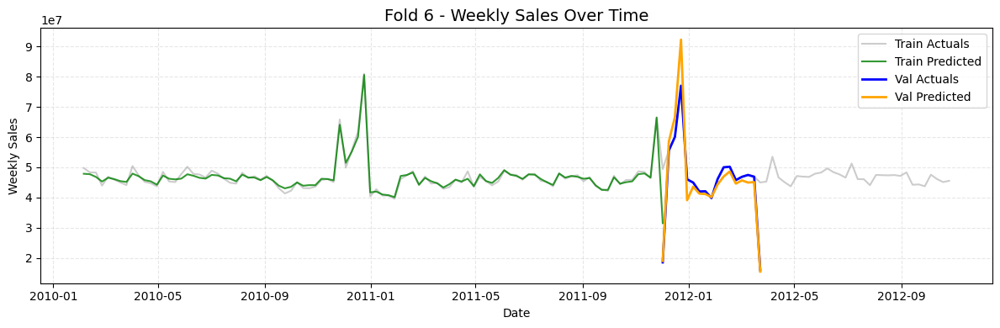


Fold 7 Scores:
Train RMSE: 5505.59 | Train WMAE: 2955.12
Valid RMSE: 4395.76 | Valid WMAE: 2055.26


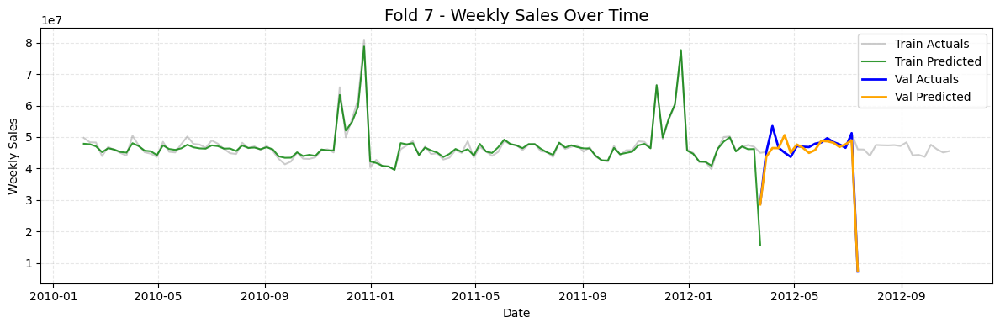


Fold 8 Scores:
Train RMSE: 5308.44 | Train WMAE: 2861.95
Valid RMSE: 3511.87 | Valid WMAE: 1775.72


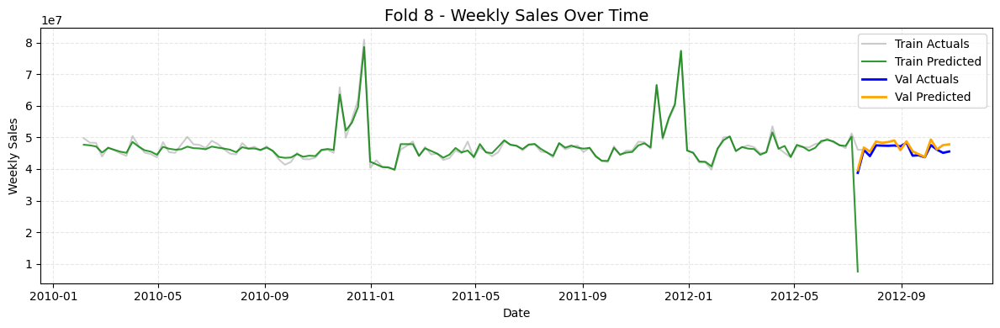


Mean Train RMSE: 5478.77
Mean Train WMAE: 3025.11
Mean Valid RMSE: 4511.00
Mean Valid WMAE: 2255.79
Best Parameters: [100, 10, 0.1, 7]
Best Result: 2255.7883959137544


In [13]:
best_params = []
best_result = 10000000

for estim in [100]:
    for min_child_weight in [1, 5, 10]:
        for learn_rate in [0.01, 0.05, 0.1]:
            for mx_depth in [5, 7]:
                model = XGBRegressor(
                    n_estimators=estim,
                    min_child_weight=min_child_weight,
                    learning_rate=learn_rate,
                    max_depth=mx_depth,
                    n_jobs=-1,
                    random_state=42
                )

                pipeline = Pipeline([
                    ('feature_engineer', feature_engineer),
                    ('preprocessor', preprocessor),
                    ('feature selection', feature_selection),
                    ('model', model)
                ])

                res = cross_validation(pipeline, X, y, df)

                if res < best_result:
                    best_result = res
                    best_params = [estim, min_child_weight, learn_rate, mx_depth]

print(f"Best Parameters: {best_params}")
print(f"Best Result: {best_result}")


Fold 5 Scores:
Train RMSE: 11704.32 | Train WMAE: 7057.56
Valid RMSE: 7122.89 | Valid WMAE: 3562.87


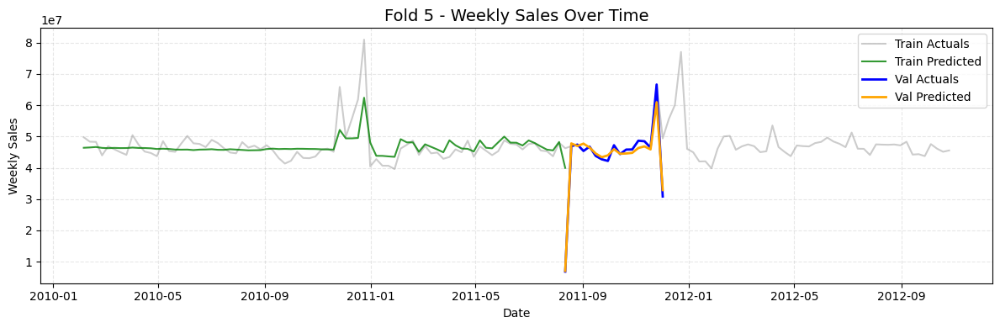


Fold 6 Scores:
Train RMSE: 11302.31 | Train WMAE: 6402.26
Valid RMSE: 5764.42 | Valid WMAE: 3111.38


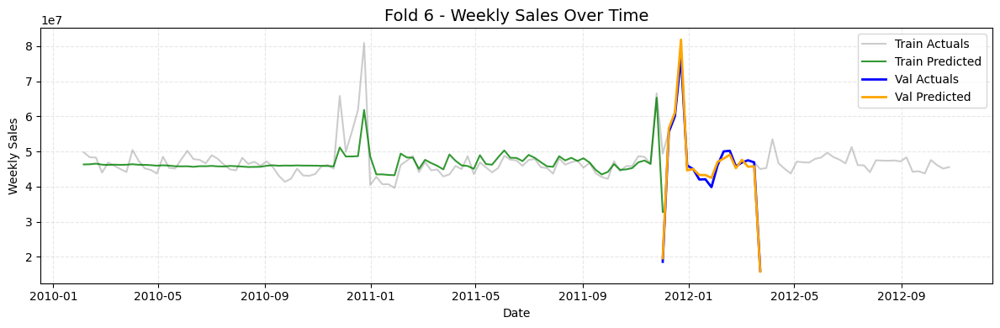


Fold 7 Scores:
Train RMSE: 11119.14 | Train WMAE: 5996.97
Valid RMSE: 4722.06 | Valid WMAE: 2638.45


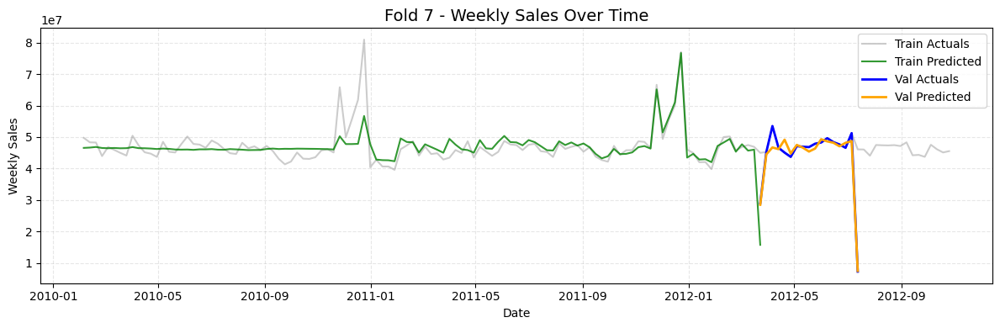


Fold 8 Scores:
Train RMSE: 10628.46 | Train WMAE: 5697.66
Valid RMSE: 3873.90 | Valid WMAE: 2286.84


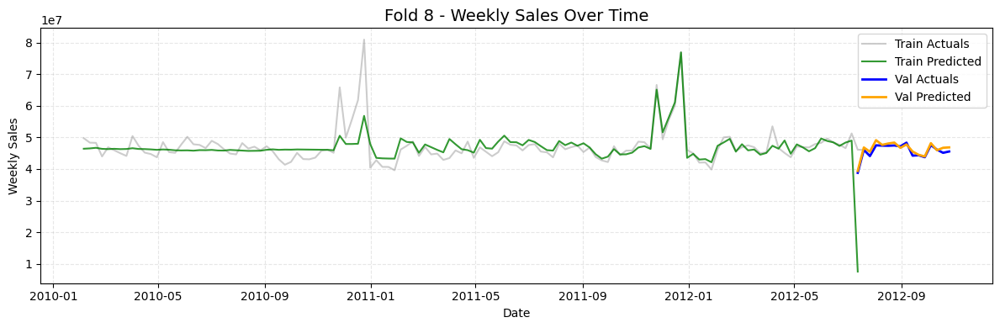


Mean Train RMSE: 11188.56
Mean Train WMAE: 6288.61
Mean Valid RMSE: 5370.82
Mean Valid WMAE: 2899.89

Fold 5 Scores:
Train RMSE: 9128.75 | Train WMAE: 5538.97
Valid RMSE: 7231.03 | Valid WMAE: 3209.12


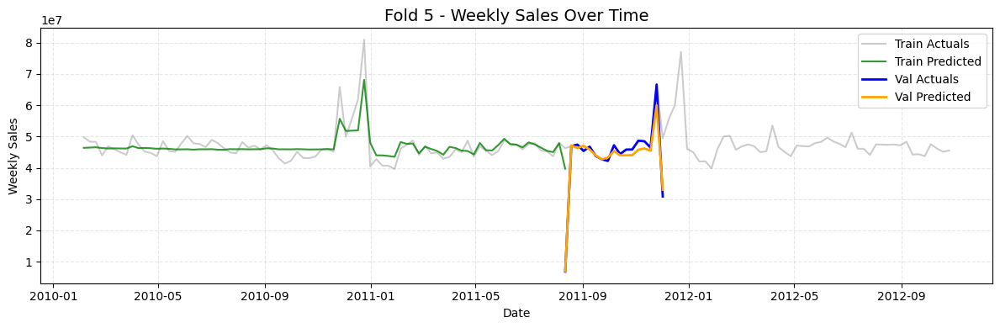


Fold 6 Scores:
Train RMSE: 8822.73 | Train WMAE: 5112.48
Valid RMSE: 5945.27 | Valid WMAE: 2851.88


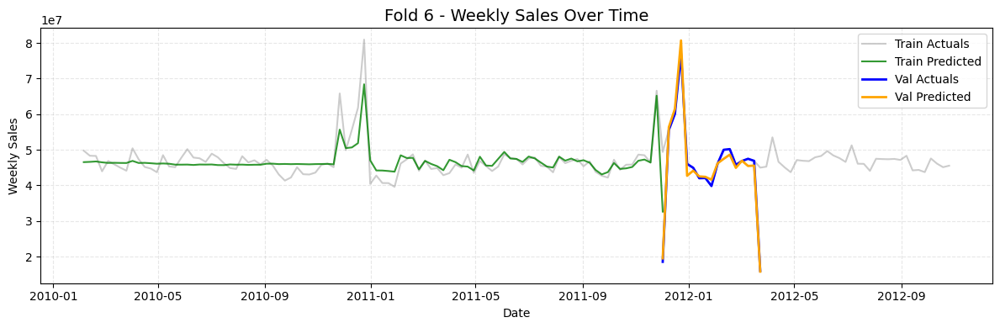


Fold 7 Scores:
Train RMSE: 9000.05 | Train WMAE: 4924.87
Valid RMSE: 4442.77 | Valid WMAE: 2403.87


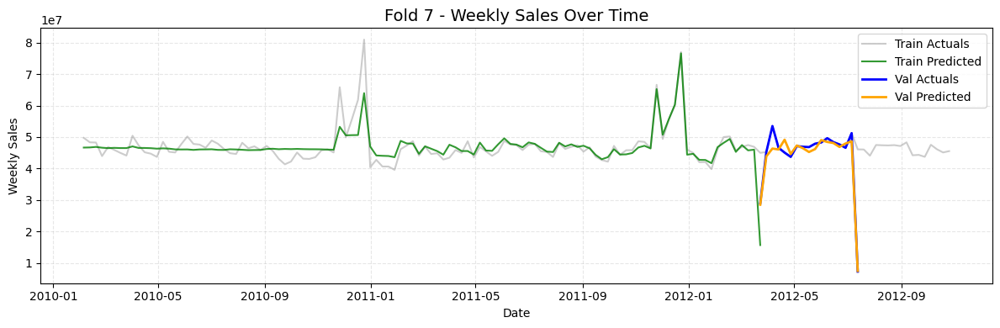


Fold 8 Scores:
Train RMSE: 8599.08 | Train WMAE: 4682.34
Valid RMSE: 3531.95 | Valid WMAE: 2013.64


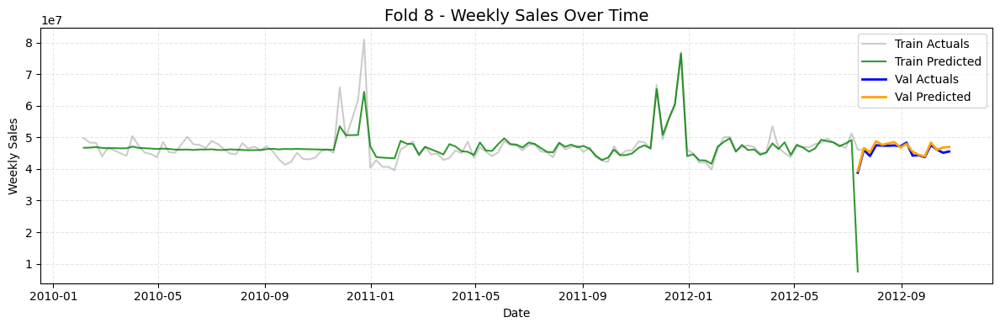


Mean Train RMSE: 8887.65
Mean Train WMAE: 5064.66
Mean Valid RMSE: 5287.75
Mean Valid WMAE: 2619.63

Fold 5 Scores:
Train RMSE: 7228.10 | Train WMAE: 4169.46
Valid RMSE: 5474.40 | Valid WMAE: 2928.47


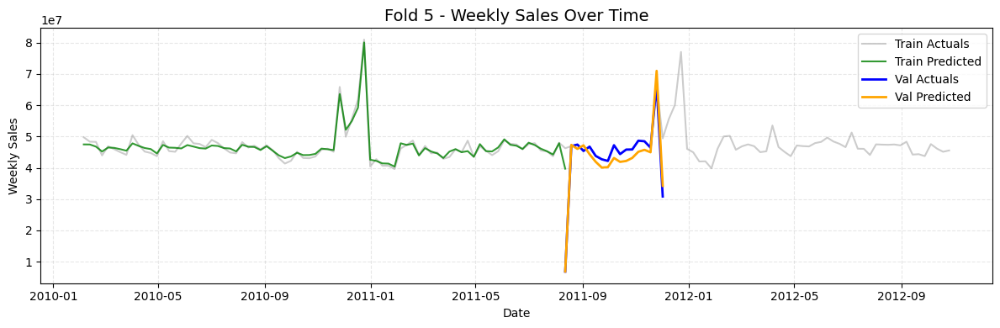


Fold 6 Scores:
Train RMSE: 7084.65 | Train WMAE: 3869.92
Valid RMSE: 5495.19 | Valid WMAE: 2890.14


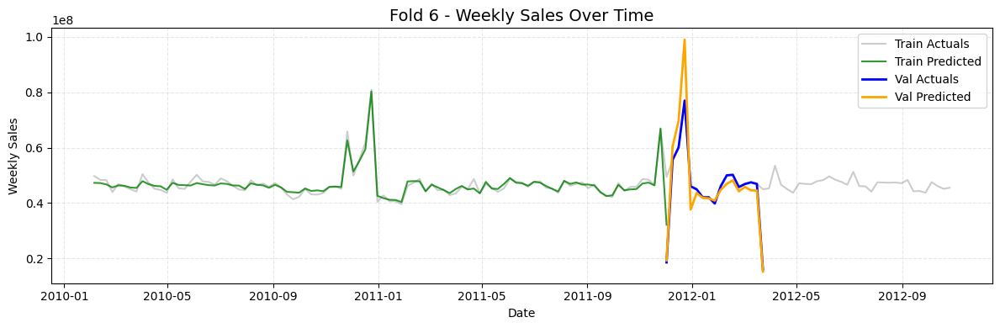


Fold 7 Scores:
Train RMSE: 6922.36 | Train WMAE: 3636.70
Valid RMSE: 4329.82 | Valid WMAE: 2175.25


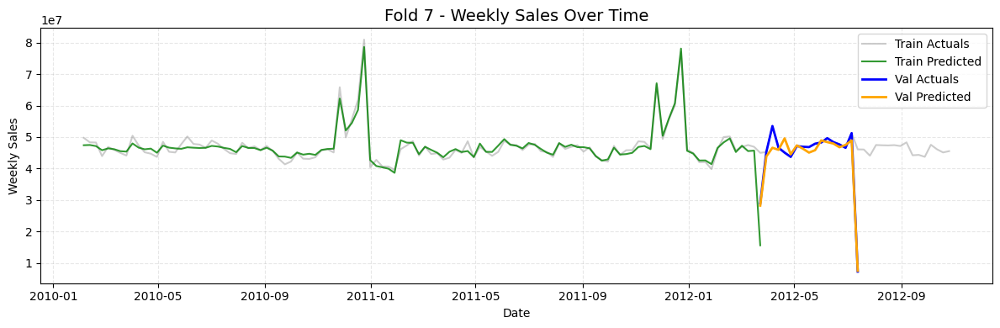


Fold 8 Scores:
Train RMSE: 6742.91 | Train WMAE: 3505.84
Valid RMSE: 3693.25 | Valid WMAE: 1923.58


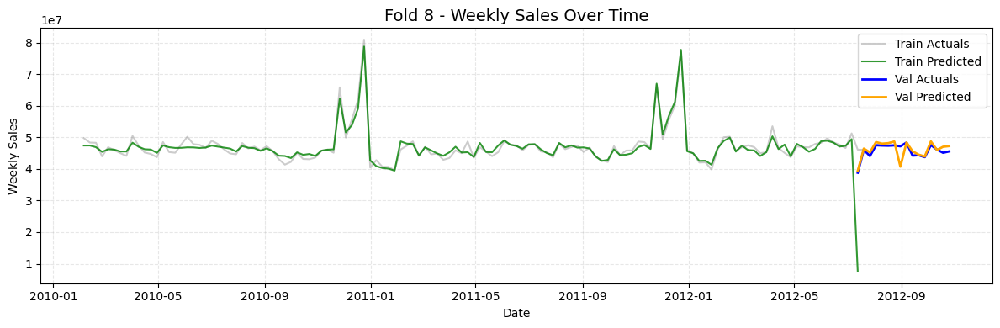


Mean Train RMSE: 6994.50
Mean Train WMAE: 3795.48
Mean Valid RMSE: 4748.16
Mean Valid WMAE: 2479.36

Fold 5 Scores:
Train RMSE: 4827.21 | Train WMAE: 2825.13
Valid RMSE: 5176.46 | Valid WMAE: 2566.50


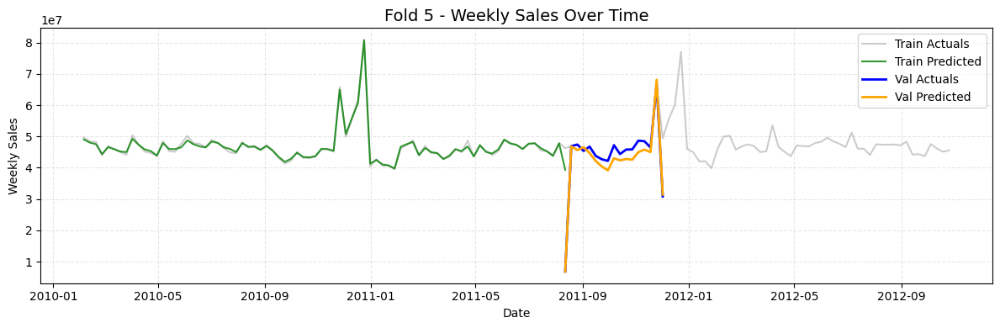


Fold 6 Scores:
Train RMSE: 4701.76 | Train WMAE: 2675.15
Valid RMSE: 5149.54 | Valid WMAE: 2633.10


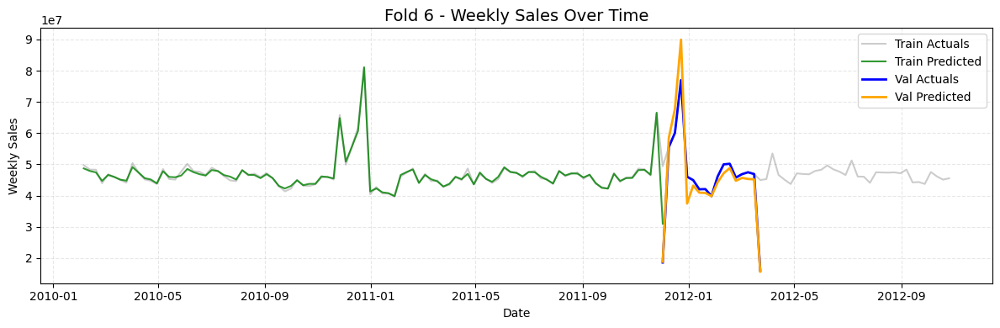


Fold 7 Scores:
Train RMSE: 4713.16 | Train WMAE: 2582.29
Valid RMSE: 4309.46 | Valid WMAE: 1993.07


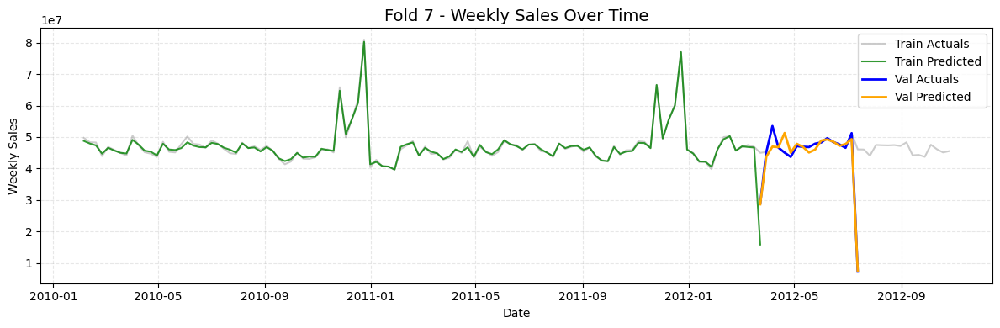


Fold 8 Scores:
Train RMSE: 4614.53 | Train WMAE: 2520.56
Valid RMSE: 3456.38 | Valid WMAE: 1763.03


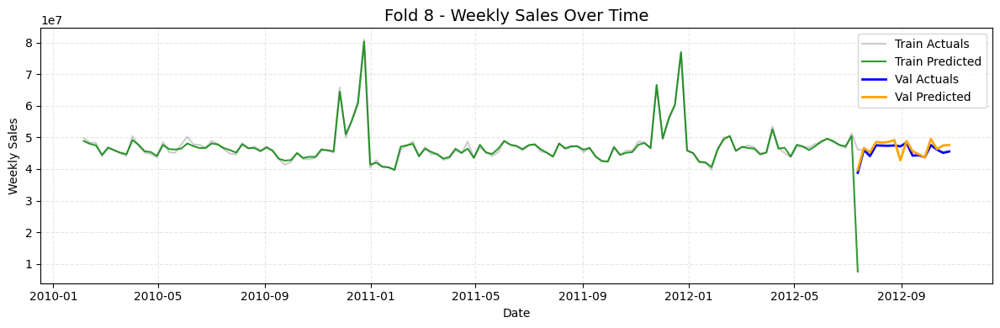


Mean Train RMSE: 4714.17
Mean Train WMAE: 2650.78
Mean Valid RMSE: 4522.96
Mean Valid WMAE: 2238.93

Fold 5 Scores:
Train RMSE: 6100.75 | Train WMAE: 3498.87
Valid RMSE: 5297.79 | Valid WMAE: 2831.43


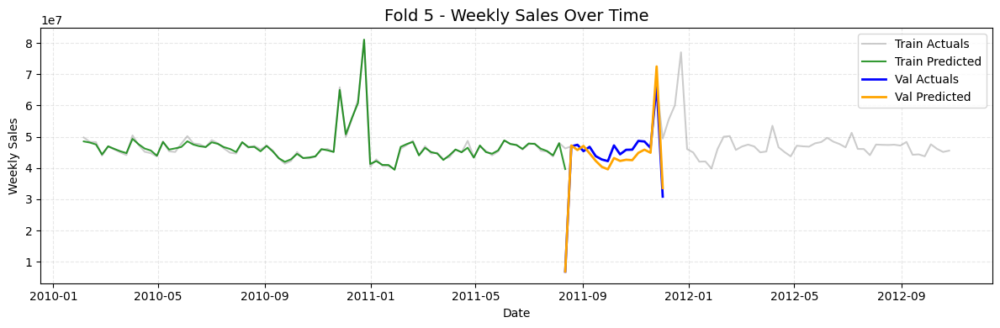


Fold 6 Scores:
Train RMSE: 6010.75 | Train WMAE: 3301.19
Valid RMSE: 5323.58 | Valid WMAE: 2837.77


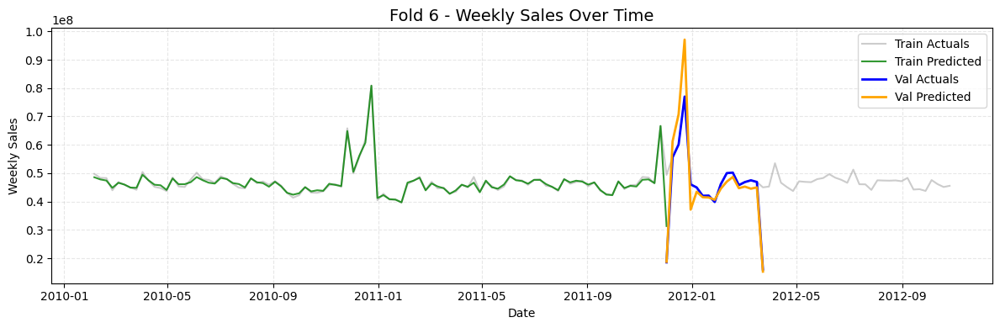


Fold 7 Scores:
Train RMSE: 5901.28 | Train WMAE: 3120.58
Valid RMSE: 4135.02 | Valid WMAE: 2089.65


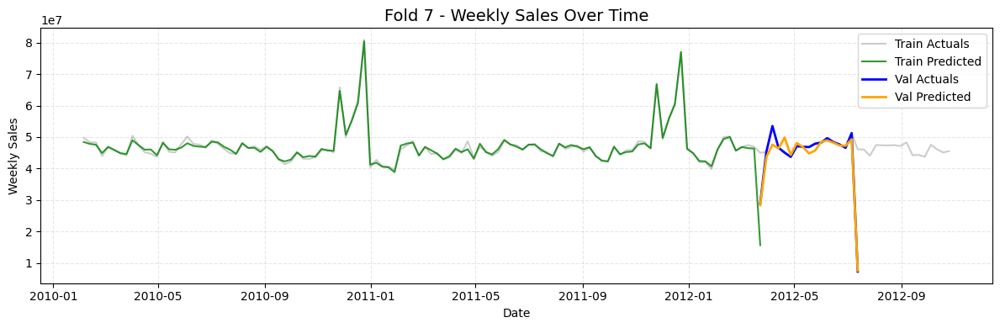


Fold 8 Scores:
Train RMSE: 5723.79 | Train WMAE: 3007.93
Valid RMSE: 3658.52 | Valid WMAE: 1890.85


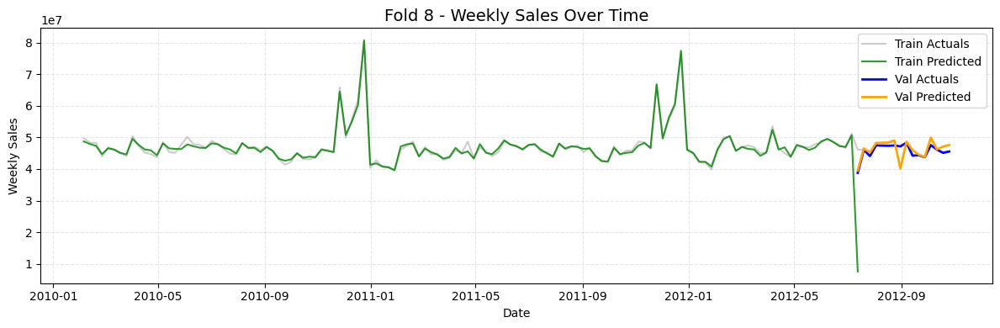


Mean Train RMSE: 5934.14
Mean Train WMAE: 3232.14
Mean Valid RMSE: 4603.73
Mean Valid WMAE: 2412.42

Fold 5 Scores:
Train RMSE: 3854.79 | Train WMAE: 2281.16
Valid RMSE: 5094.56 | Valid WMAE: 2552.25


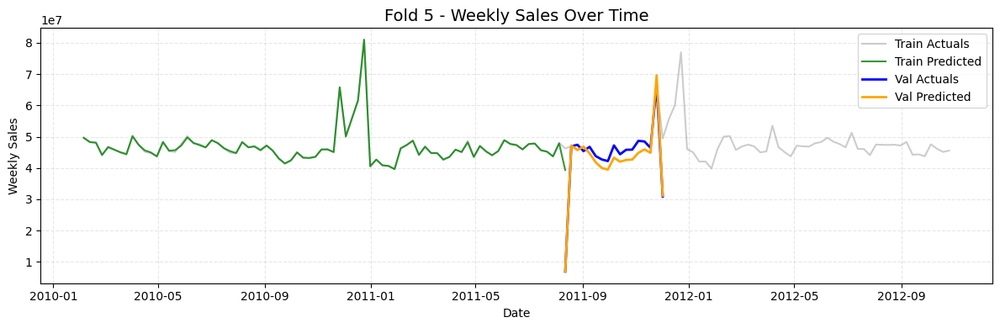


Fold 6 Scores:
Train RMSE: 3807.86 | Train WMAE: 2189.53
Valid RMSE: 5395.41 | Valid WMAE: 2606.16


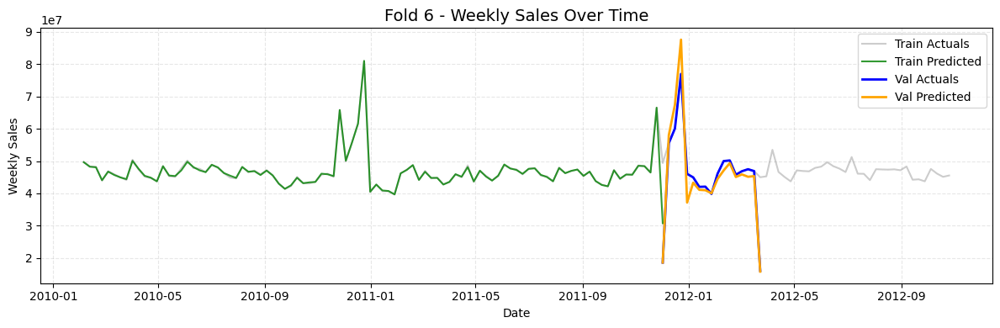


Fold 7 Scores:
Train RMSE: 3793.94 | Train WMAE: 2120.35
Valid RMSE: 4490.00 | Valid WMAE: 1967.15


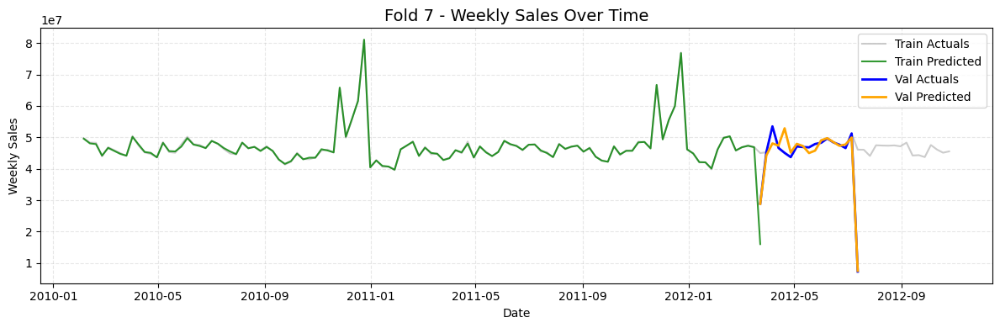


Fold 8 Scores:
Train RMSE: 3753.10 | Train WMAE: 2099.23
Valid RMSE: 3326.73 | Valid WMAE: 1684.36


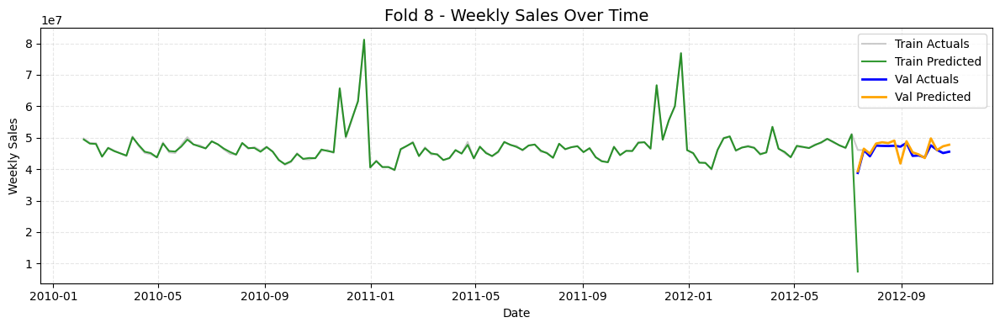


Mean Train RMSE: 3802.42
Mean Train WMAE: 2172.57
Mean Valid RMSE: 4576.68
Mean Valid WMAE: 2202.48

Fold 5 Scores:
Train RMSE: 11720.90 | Train WMAE: 7066.25
Valid RMSE: 6886.38 | Valid WMAE: 3511.17


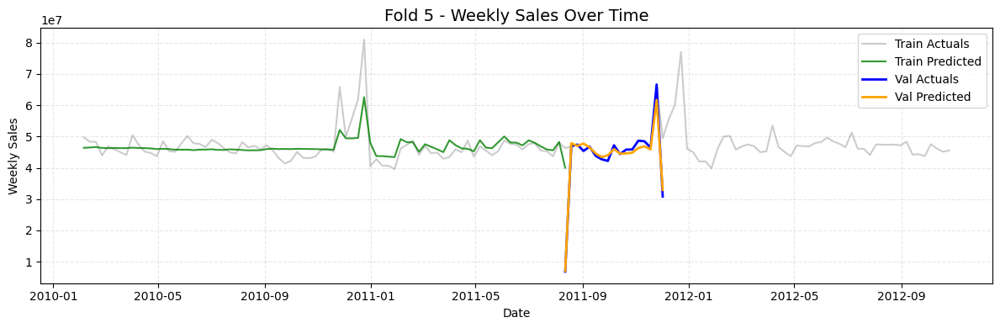


Fold 6 Scores:
Train RMSE: 11293.48 | Train WMAE: 6401.70
Valid RMSE: 5545.85 | Valid WMAE: 3099.52


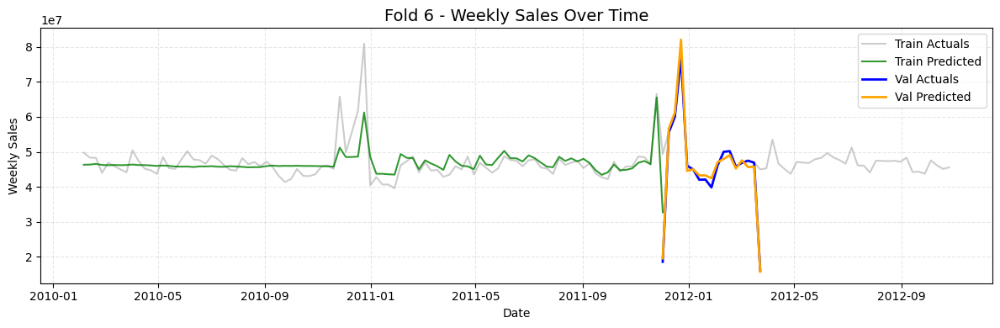


Fold 7 Scores:
Train RMSE: 11116.10 | Train WMAE: 5988.69
Valid RMSE: 4721.09 | Valid WMAE: 2640.67


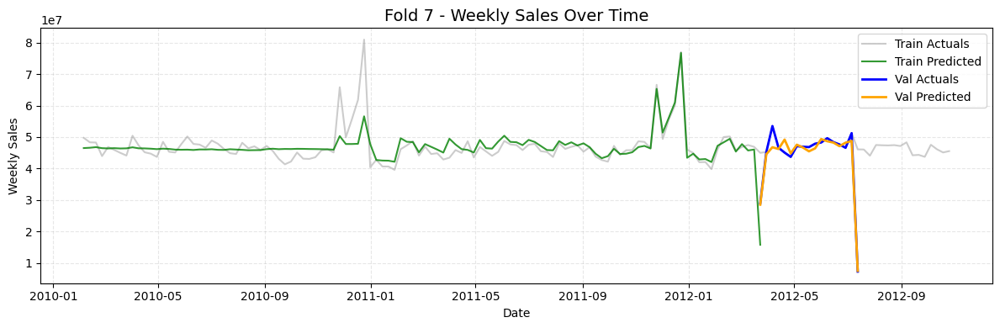


Fold 8 Scores:
Train RMSE: 10616.41 | Train WMAE: 5686.37
Valid RMSE: 3863.12 | Valid WMAE: 2279.79


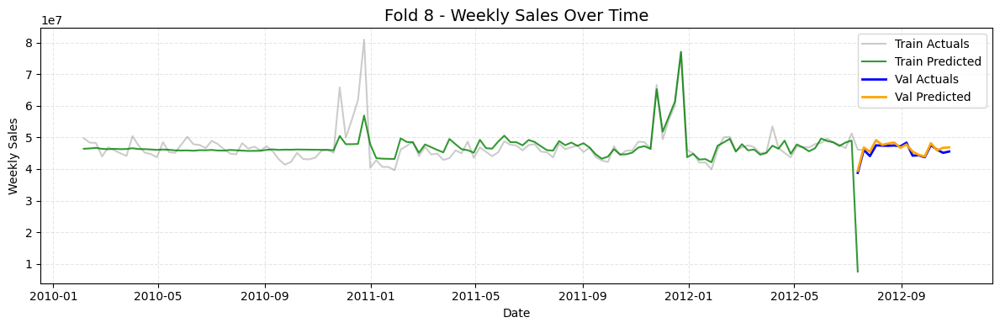


Mean Train RMSE: 11186.72
Mean Train WMAE: 6285.75
Mean Valid RMSE: 5254.11
Mean Valid WMAE: 2882.79

Fold 5 Scores:
Train RMSE: 9087.18 | Train WMAE: 5513.27
Valid RMSE: 7105.11 | Valid WMAE: 3174.35


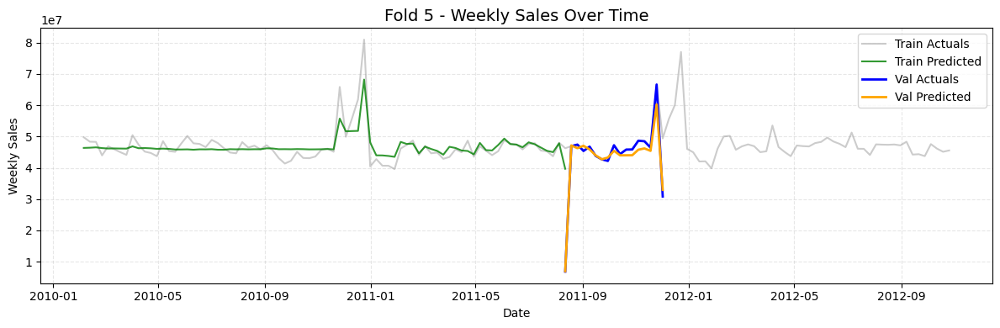


Fold 6 Scores:
Train RMSE: 8859.09 | Train WMAE: 5125.61
Valid RMSE: 5593.99 | Valid WMAE: 2815.53


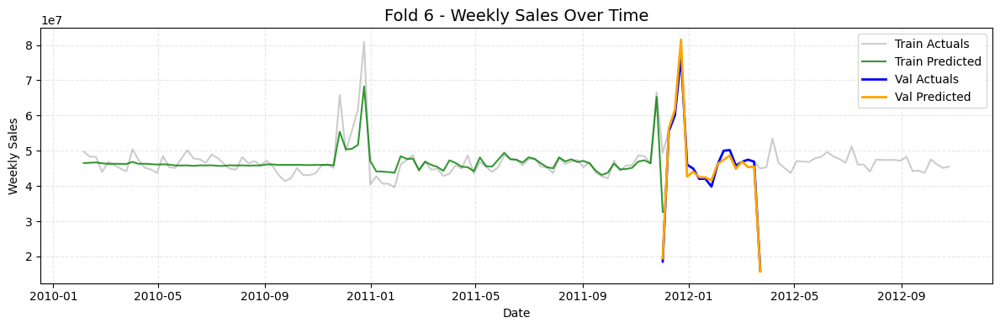


Fold 7 Scores:
Train RMSE: 8976.91 | Train WMAE: 4907.29
Valid RMSE: 4444.43 | Valid WMAE: 2400.17


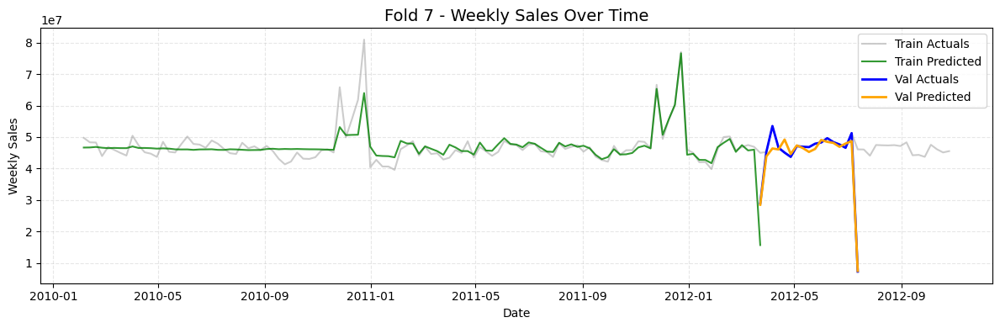


Fold 8 Scores:
Train RMSE: 8584.19 | Train WMAE: 4672.63
Valid RMSE: 3533.23 | Valid WMAE: 2014.72


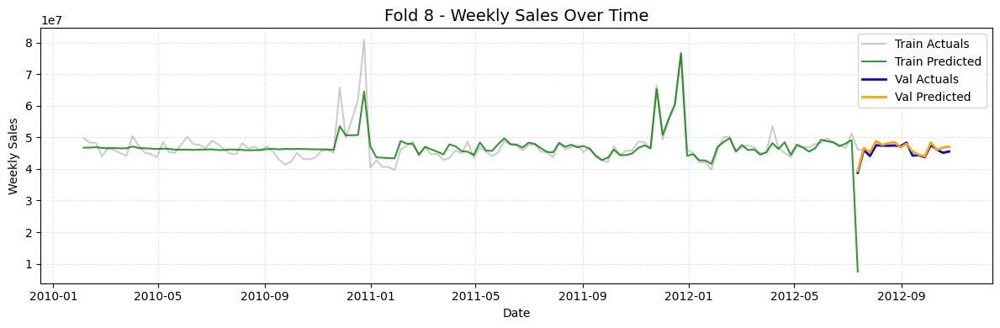


Mean Train RMSE: 8876.84
Mean Train WMAE: 5054.70
Mean Valid RMSE: 5169.19
Mean Valid WMAE: 2601.19

Fold 5 Scores:
Train RMSE: 7214.20 | Train WMAE: 4138.34
Valid RMSE: 5290.85 | Valid WMAE: 2865.34


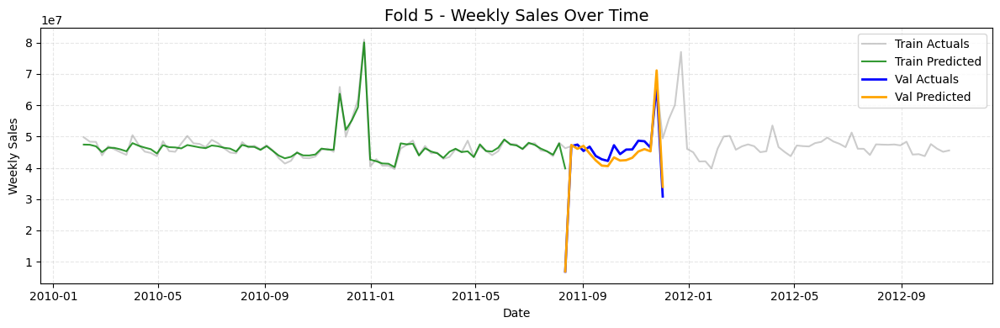


Fold 6 Scores:
Train RMSE: 7076.02 | Train WMAE: 3868.11
Valid RMSE: 5325.77 | Valid WMAE: 2834.58


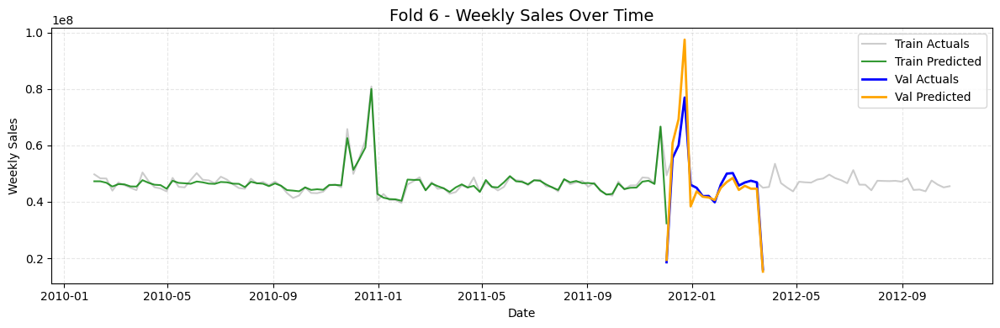


Fold 7 Scores:
Train RMSE: 6913.32 | Train WMAE: 3629.38
Valid RMSE: 4281.11 | Valid WMAE: 2154.87


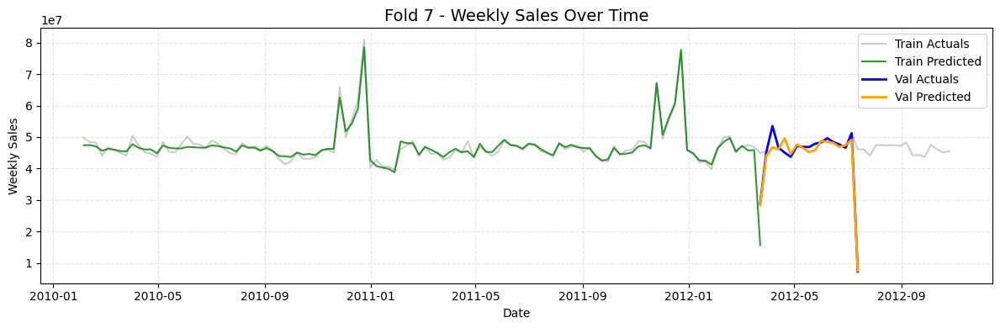


Fold 8 Scores:
Train RMSE: 6660.52 | Train WMAE: 3478.25
Valid RMSE: 3626.75 | Valid WMAE: 1886.27


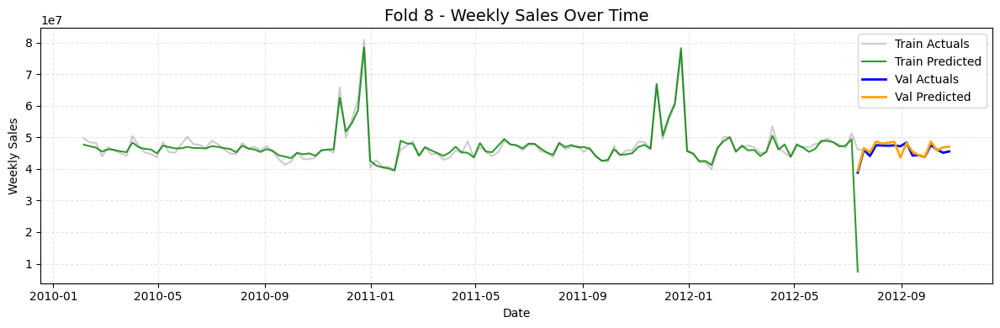


Mean Train RMSE: 6966.02
Mean Train WMAE: 3778.52
Mean Valid RMSE: 4631.12
Mean Valid WMAE: 2435.26

Fold 5 Scores:
Train RMSE: 4870.23 | Train WMAE: 2843.26
Valid RMSE: 5425.34 | Valid WMAE: 2641.89


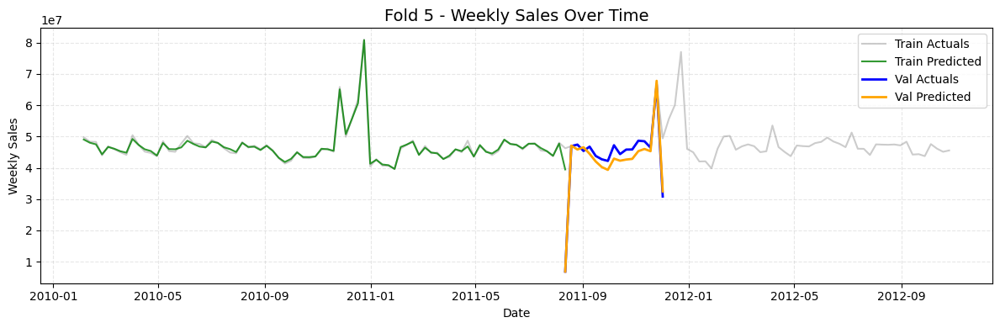


Fold 6 Scores:
Train RMSE: 4748.56 | Train WMAE: 2686.73
Valid RMSE: 4932.72 | Valid WMAE: 2623.56


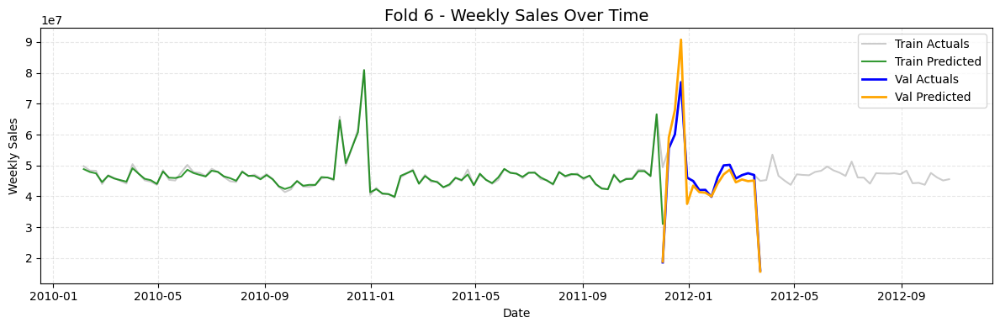


Fold 7 Scores:
Train RMSE: 4763.46 | Train WMAE: 2580.72
Valid RMSE: 4364.22 | Valid WMAE: 1991.93


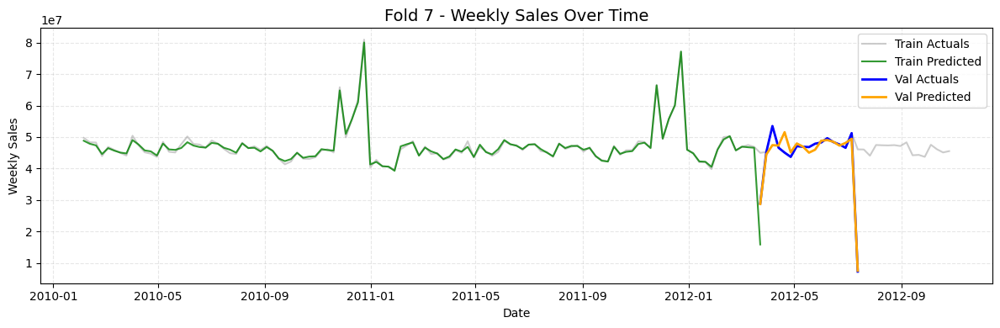


Fold 8 Scores:
Train RMSE: 4642.76 | Train WMAE: 2532.57
Valid RMSE: 3424.36 | Valid WMAE: 1757.64


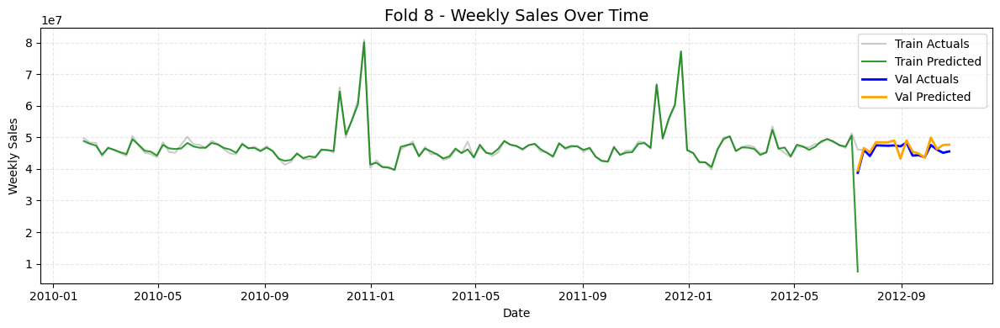


Mean Train RMSE: 4756.25
Mean Train WMAE: 2660.82
Mean Valid RMSE: 4536.66
Mean Valid WMAE: 2253.75

Fold 5 Scores:
Train RMSE: 6212.25 | Train WMAE: 3550.26
Valid RMSE: 5117.64 | Valid WMAE: 2749.90


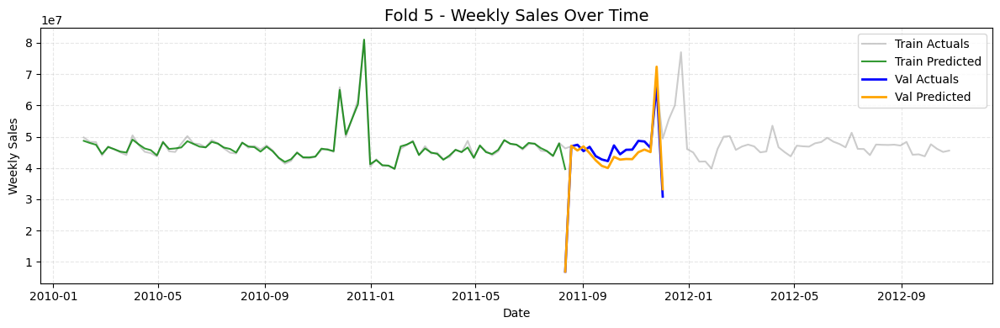


Fold 6 Scores:
Train RMSE: 6081.16 | Train WMAE: 3339.59
Valid RMSE: 5288.67 | Valid WMAE: 2854.09


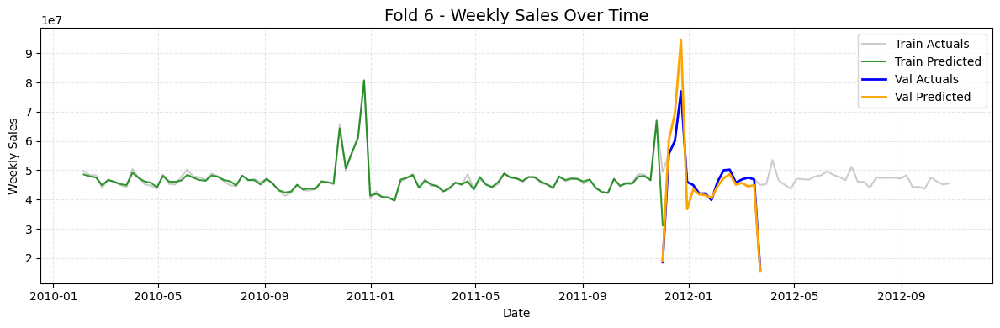


Fold 7 Scores:
Train RMSE: 5912.29 | Train WMAE: 3122.90
Valid RMSE: 4286.66 | Valid WMAE: 2115.10


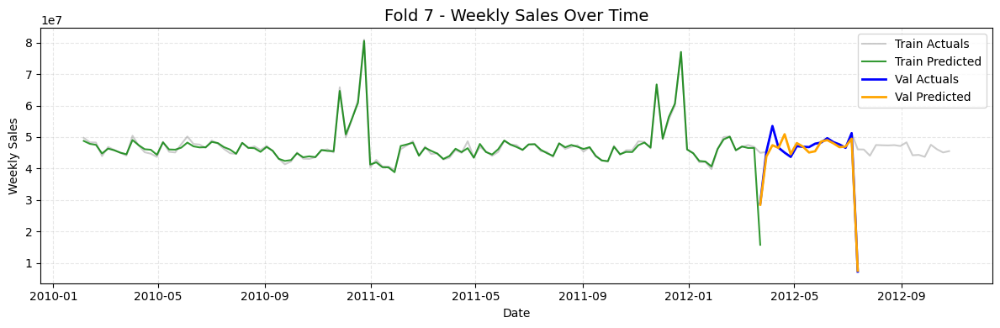


Fold 8 Scores:
Train RMSE: 5765.80 | Train WMAE: 3041.64
Valid RMSE: 3623.14 | Valid WMAE: 1879.93


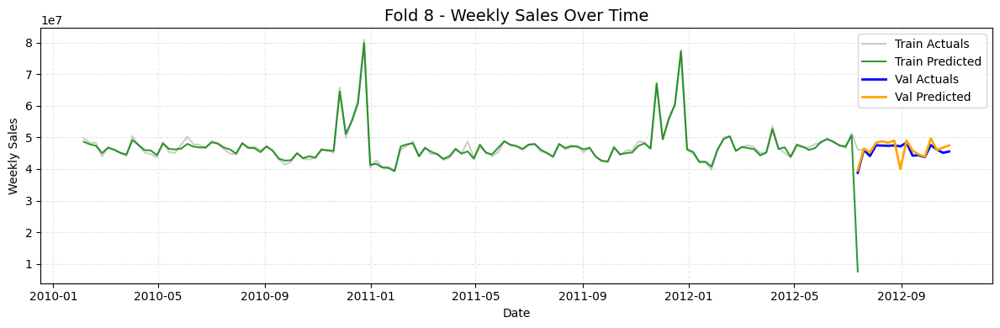


Mean Train RMSE: 5992.87
Mean Train WMAE: 3263.60
Mean Valid RMSE: 4579.03
Mean Valid WMAE: 2399.75

Fold 5 Scores:
Train RMSE: 3947.20 | Train WMAE: 2318.03
Valid RMSE: 4978.64 | Valid WMAE: 2532.20


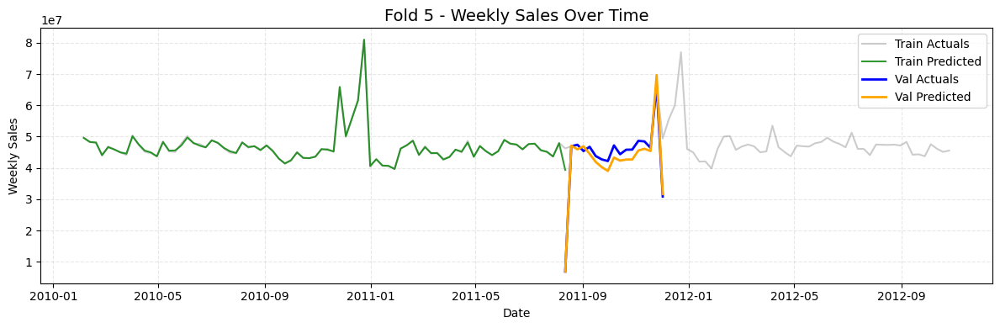


Fold 6 Scores:
Train RMSE: 3809.57 | Train WMAE: 2191.55
Valid RMSE: 5034.29 | Valid WMAE: 2581.39


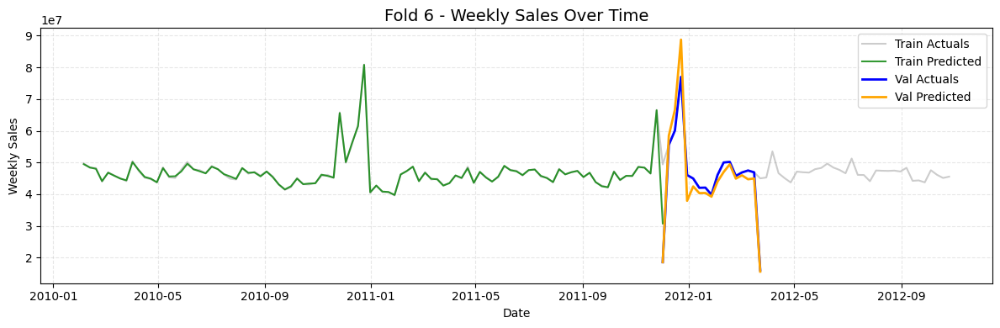


Fold 7 Scores:
Train RMSE: 3844.83 | Train WMAE: 2147.44
Valid RMSE: 4413.35 | Valid WMAE: 1974.52


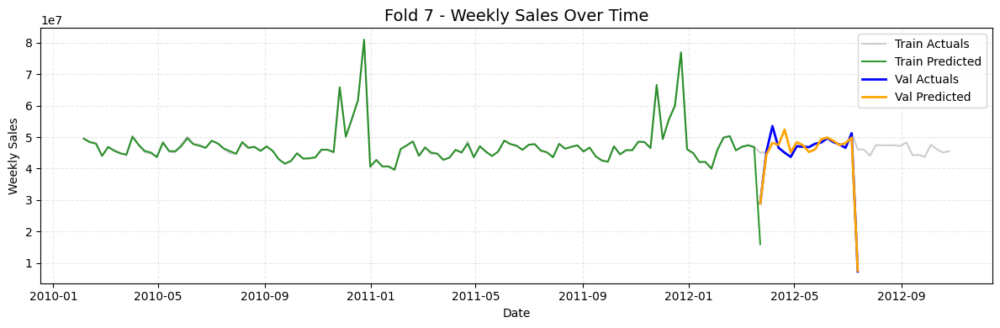


Fold 8 Scores:
Train RMSE: 3824.06 | Train WMAE: 2121.63
Valid RMSE: 3415.00 | Valid WMAE: 1722.94


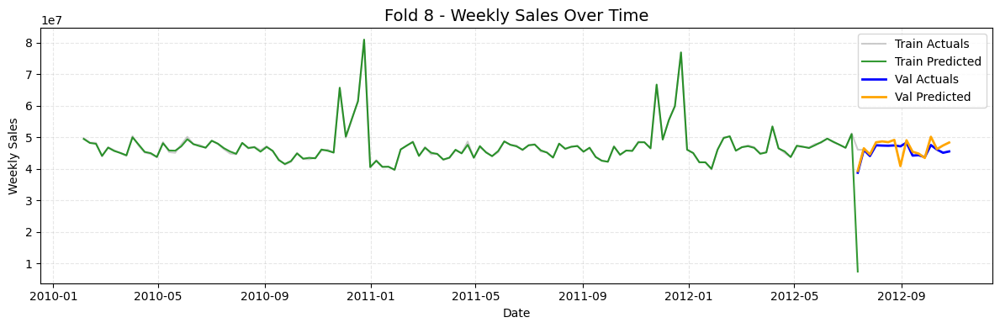


Mean Train RMSE: 3856.42
Mean Train WMAE: 2194.66
Mean Valid RMSE: 4460.32
Mean Valid WMAE: 2202.76

Fold 5 Scores:
Train RMSE: 11748.20 | Train WMAE: 7085.72
Valid RMSE: 6968.10 | Valid WMAE: 3526.13


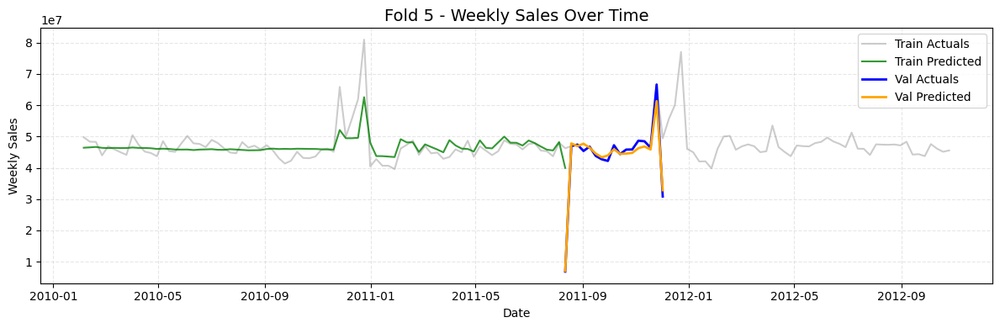


Fold 6 Scores:
Train RMSE: 11288.52 | Train WMAE: 6390.14
Valid RMSE: 5538.05 | Valid WMAE: 3085.49


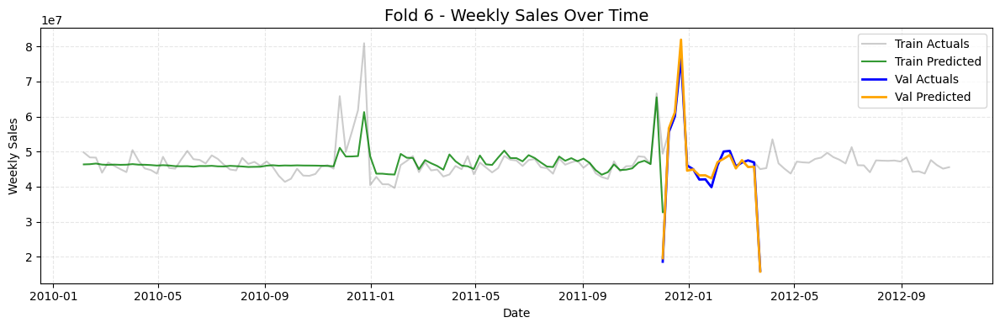


Fold 7 Scores:
Train RMSE: 10940.84 | Train WMAE: 5916.72
Valid RMSE: 4713.81 | Valid WMAE: 2637.22


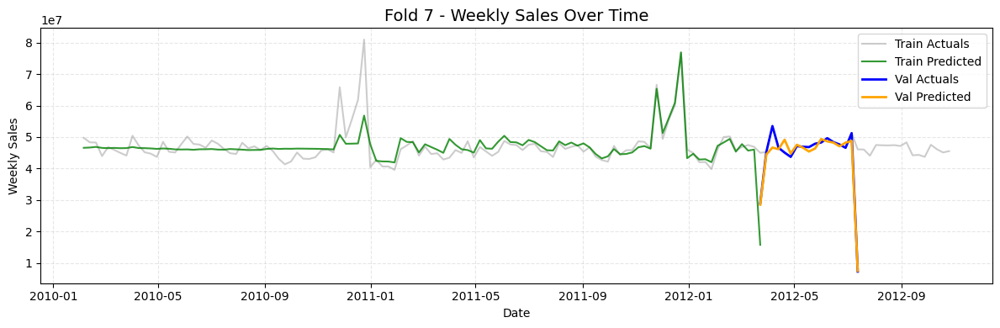


Fold 8 Scores:
Train RMSE: 10625.89 | Train WMAE: 5694.41
Valid RMSE: 3870.91 | Valid WMAE: 2285.27


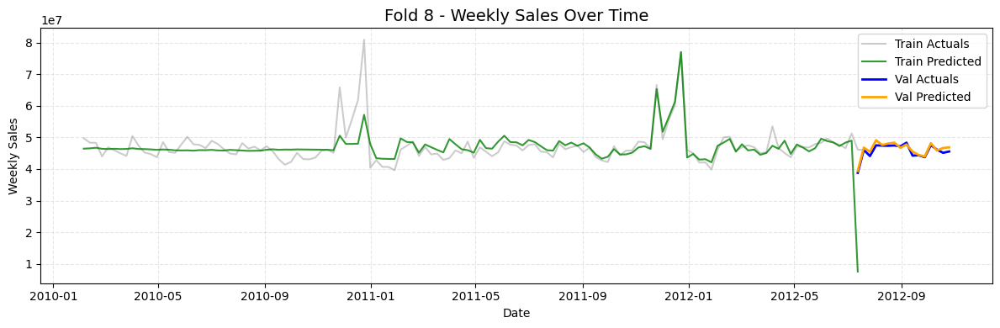


Mean Train RMSE: 11150.86
Mean Train WMAE: 6271.75
Mean Valid RMSE: 5272.72
Mean Valid WMAE: 2883.53

Fold 5 Scores:
Train RMSE: 9122.52 | Train WMAE: 5522.71
Valid RMSE: 7074.52 | Valid WMAE: 3173.76


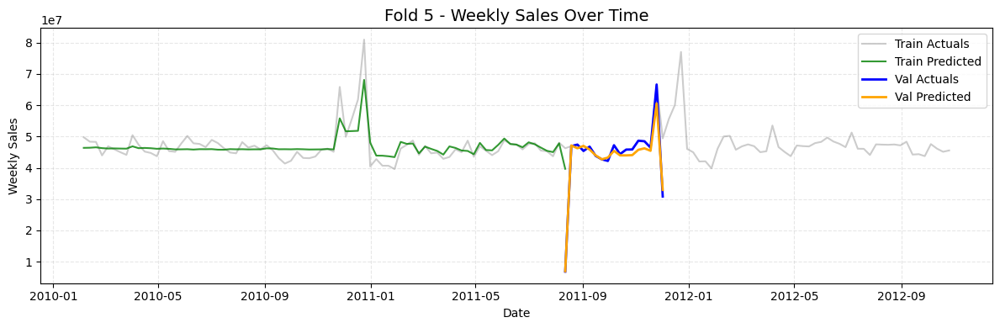


Fold 6 Scores:
Train RMSE: 8899.35 | Train WMAE: 5138.71
Valid RMSE: 5481.27 | Valid WMAE: 2823.36


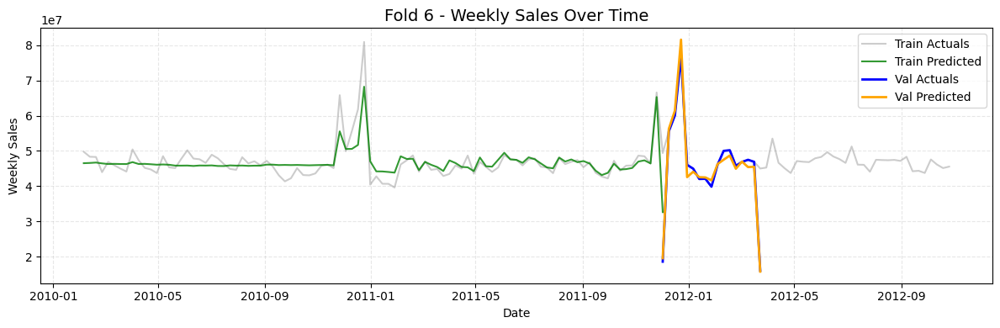


Fold 7 Scores:
Train RMSE: 9011.64 | Train WMAE: 4918.58
Valid RMSE: 4453.87 | Valid WMAE: 2392.61


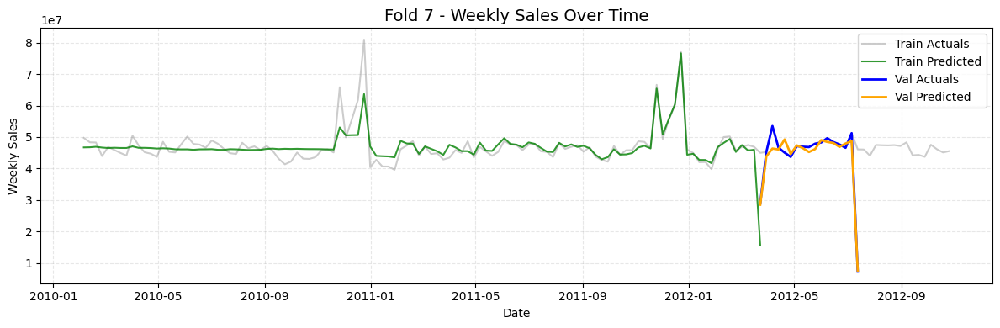


Fold 8 Scores:
Train RMSE: 8621.71 | Train WMAE: 4685.35
Valid RMSE: 3535.99 | Valid WMAE: 2016.73


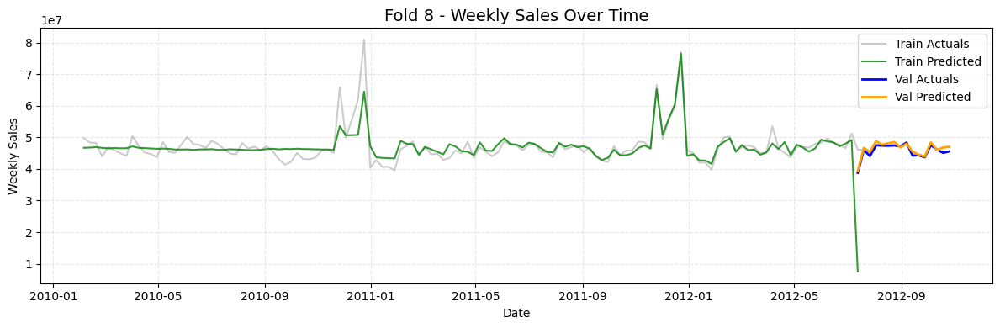


Mean Train RMSE: 8913.80
Mean Train WMAE: 5066.34
Mean Valid RMSE: 5136.41
Mean Valid WMAE: 2601.61

Fold 5 Scores:
Train RMSE: 7264.22 | Train WMAE: 4173.02
Valid RMSE: 5313.48 | Valid WMAE: 2866.28


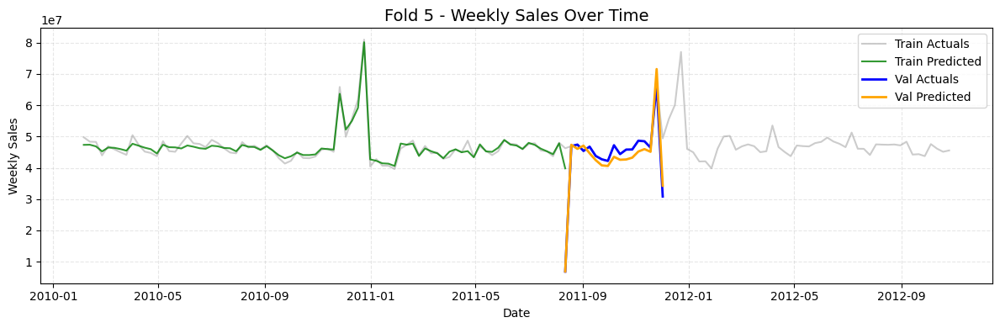


Fold 6 Scores:
Train RMSE: 7092.40 | Train WMAE: 3859.91
Valid RMSE: 5379.57 | Valid WMAE: 2866.48


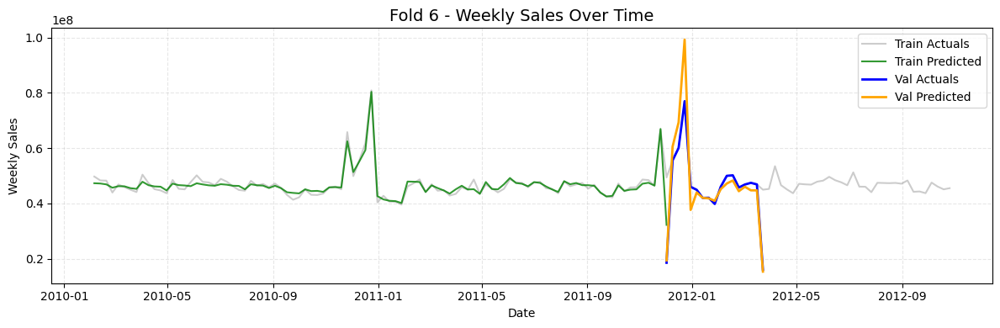


Fold 7 Scores:
Train RMSE: 6920.36 | Train WMAE: 3639.56
Valid RMSE: 4333.56 | Valid WMAE: 2151.38


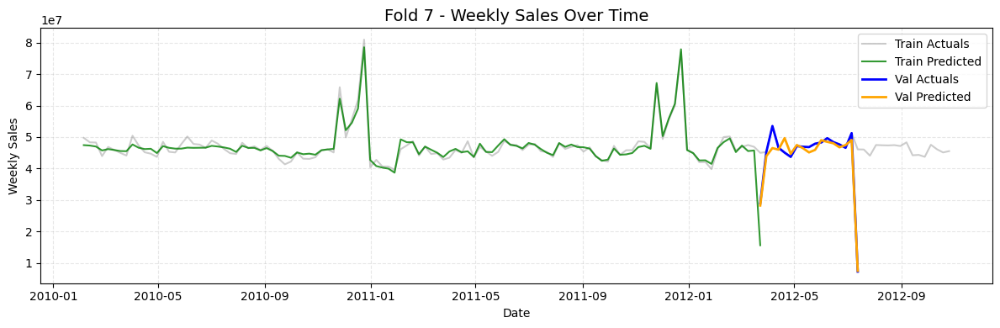


Fold 8 Scores:
Train RMSE: 6773.80 | Train WMAE: 3530.62
Valid RMSE: 3692.91 | Valid WMAE: 1934.12


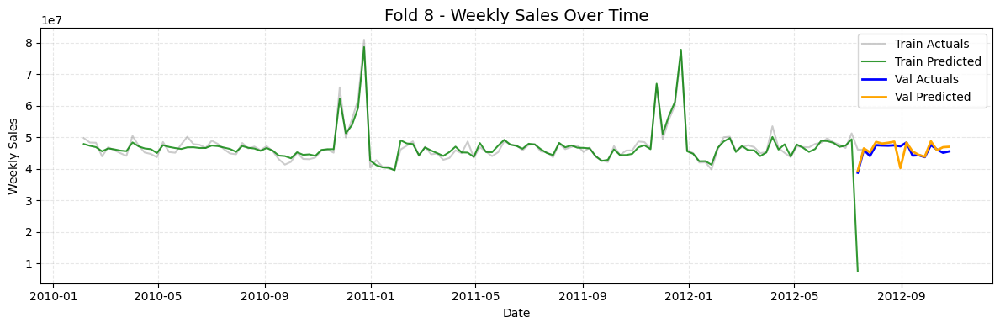


Mean Train RMSE: 7012.70
Mean Train WMAE: 3800.78
Mean Valid RMSE: 4679.88
Mean Valid WMAE: 2454.57

Fold 5 Scores:
Train RMSE: 4946.71 | Train WMAE: 2834.93
Valid RMSE: 5518.78 | Valid WMAE: 2658.20


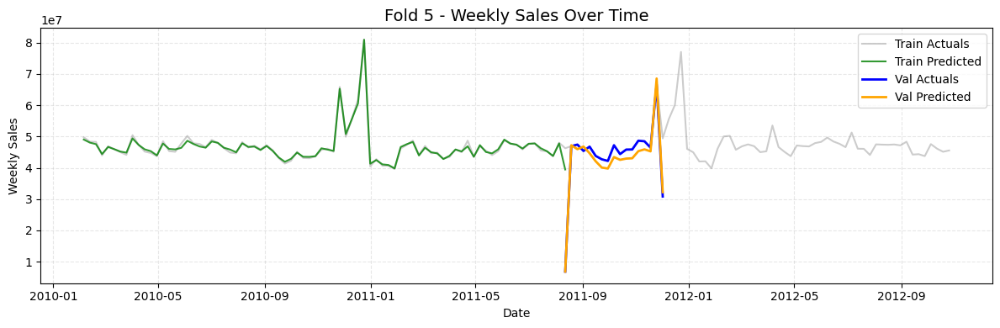


Fold 6 Scores:
Train RMSE: 4832.30 | Train WMAE: 2704.35
Valid RMSE: 4961.89 | Valid WMAE: 2632.44


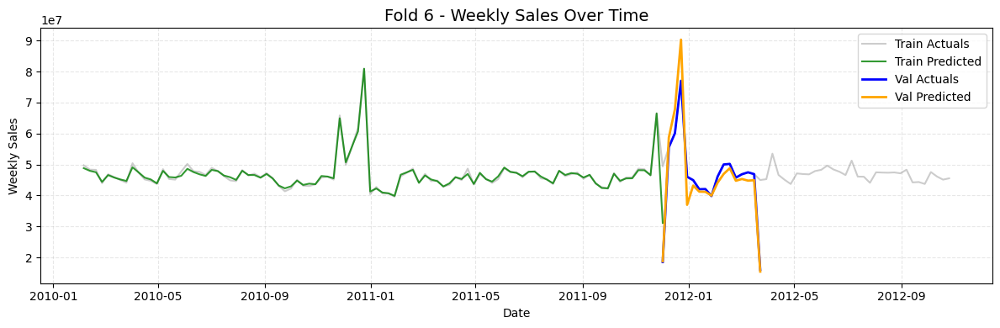


Fold 7 Scores:
Train RMSE: 4786.94 | Train WMAE: 2586.48
Valid RMSE: 4366.57 | Valid WMAE: 2006.23


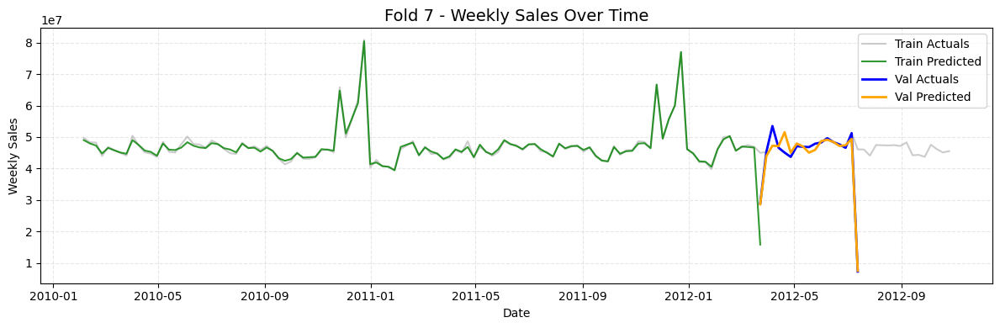


Fold 8 Scores:
Train RMSE: 4681.36 | Train WMAE: 2540.98
Valid RMSE: 3513.30 | Valid WMAE: 1781.42


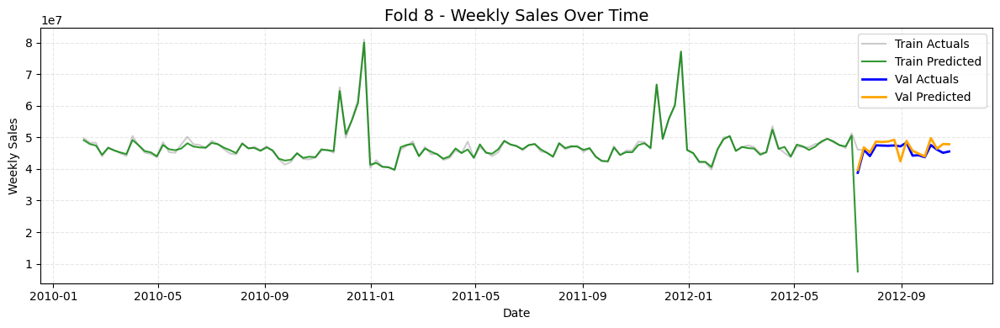


Mean Train RMSE: 4811.83
Mean Train WMAE: 2666.68
Mean Valid RMSE: 4590.13
Mean Valid WMAE: 2269.57

Fold 5 Scores:
Train RMSE: 6185.26 | Train WMAE: 3532.48
Valid RMSE: 5215.45 | Valid WMAE: 2746.90


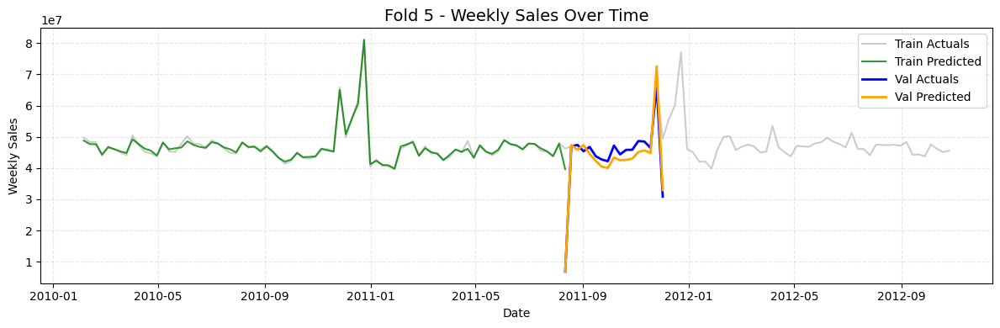


Fold 6 Scores:
Train RMSE: 6010.98 | Train WMAE: 3297.97
Valid RMSE: 5285.07 | Valid WMAE: 2879.53


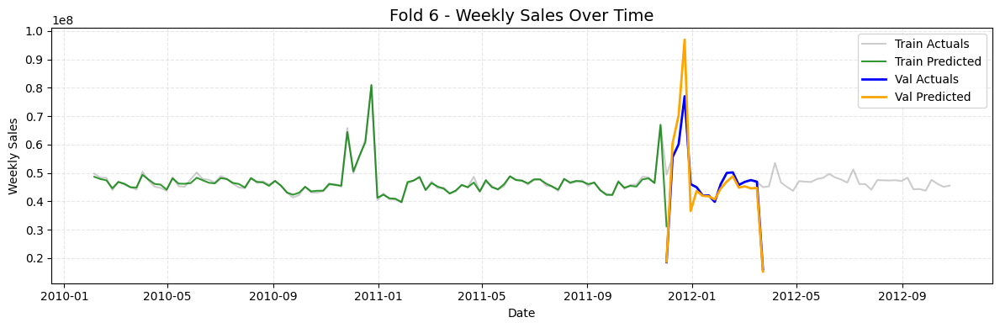


Fold 7 Scores:
Train RMSE: 5920.24 | Train WMAE: 3131.06
Valid RMSE: 4363.47 | Valid WMAE: 2114.59


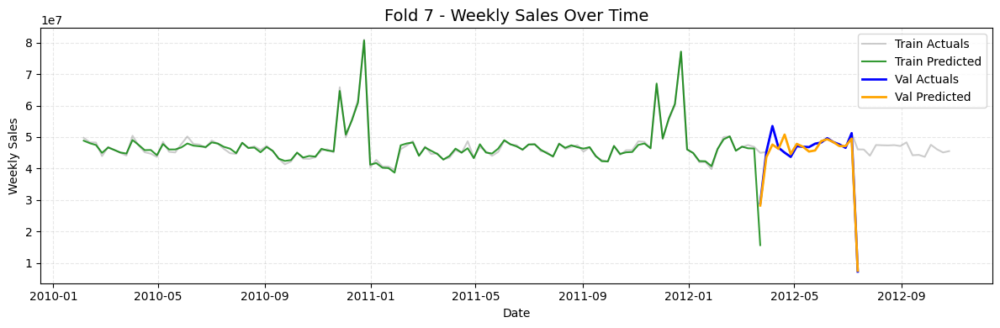


Fold 8 Scores:
Train RMSE: 5763.64 | Train WMAE: 3044.42
Valid RMSE: 3632.08 | Valid WMAE: 1898.94


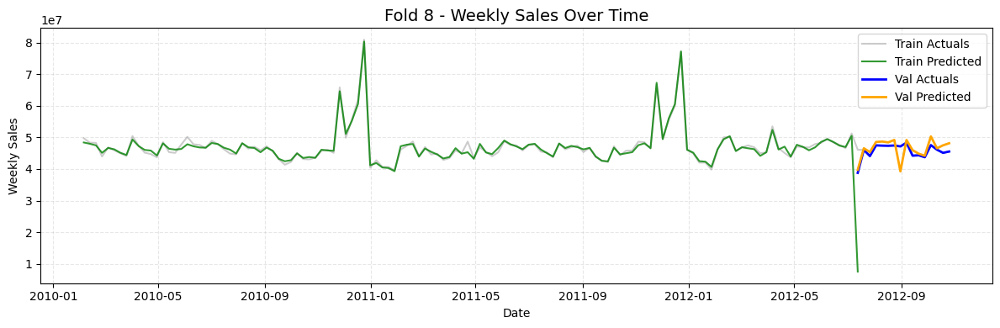


Mean Train RMSE: 5970.03
Mean Train WMAE: 3251.48
Mean Valid RMSE: 4624.02
Mean Valid WMAE: 2409.99

Fold 5 Scores:
Train RMSE: 3945.60 | Train WMAE: 2313.90
Valid RMSE: 5067.68 | Valid WMAE: 2503.79


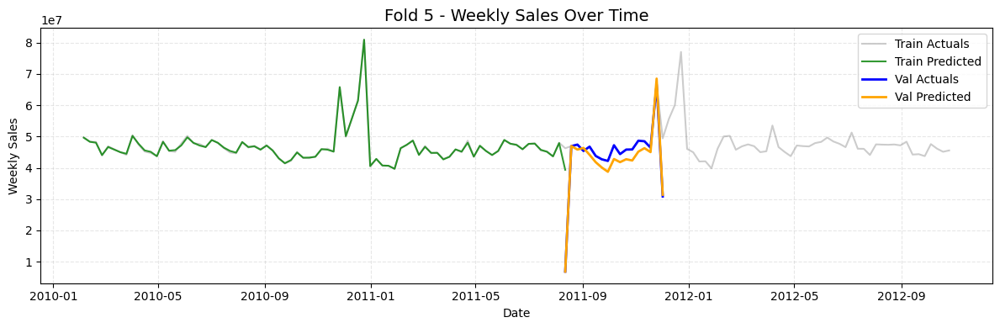


Fold 6 Scores:
Train RMSE: 3945.54 | Train WMAE: 2230.70
Valid RMSE: 4891.48 | Valid WMAE: 2550.58


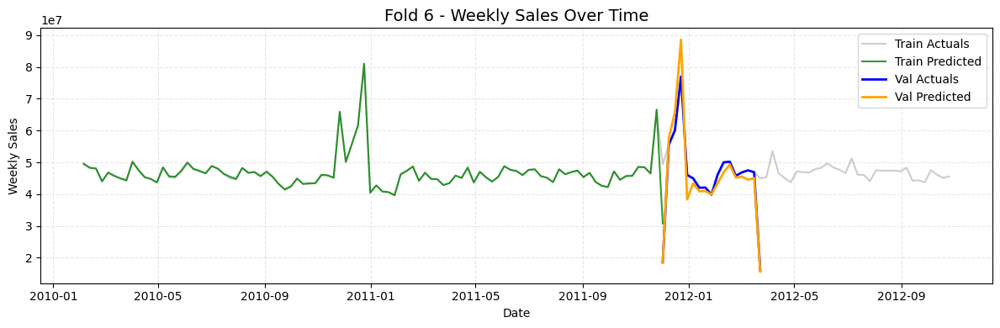


Fold 7 Scores:
Train RMSE: 3850.60 | Train WMAE: 2132.76
Valid RMSE: 4420.33 | Valid WMAE: 1961.09


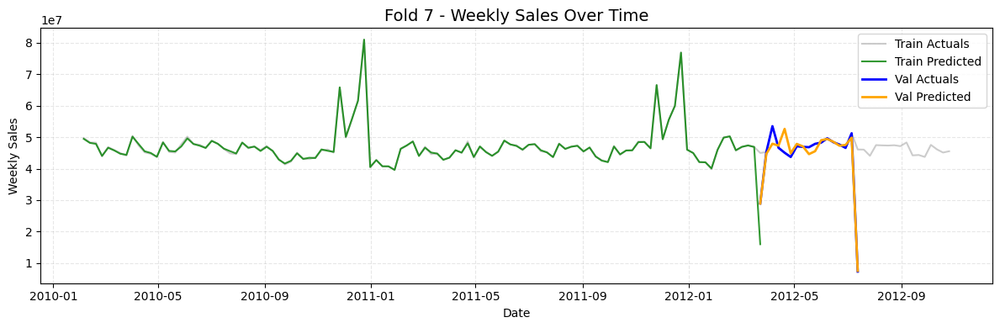


Fold 8 Scores:
Train RMSE: 3846.16 | Train WMAE: 2136.89
Valid RMSE: 3420.91 | Valid WMAE: 1692.89


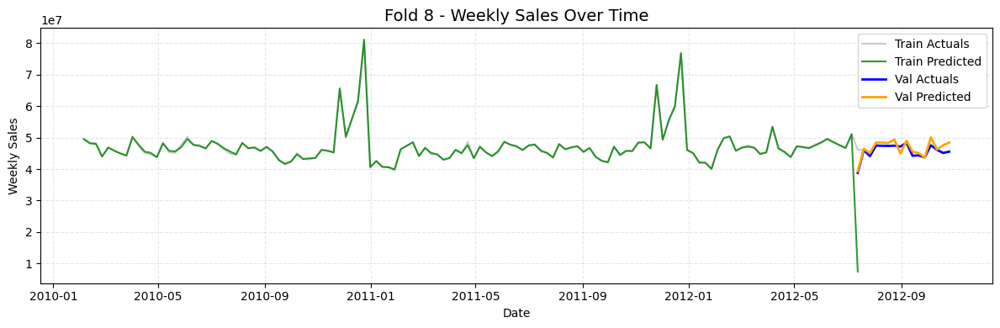


Mean Train RMSE: 3896.98
Mean Train WMAE: 2203.56
Mean Valid RMSE: 4450.10
Mean Valid WMAE: 2177.09
Best Parameters: [300, 10, 0.1, 7]
Best Result: 2177.0889920733093


In [14]:
best_params = []
best_result = 10000000

for estim in [300]:
    for min_child_weight in [1, 5, 10]:
        for learn_rate in [0.01, 0.05, 0.1]:
            for mx_depth in [5, 7]:
                model = XGBRegressor(
                    n_estimators=estim,
                    min_child_weight=min_child_weight,
                    learning_rate=learn_rate,
                    max_depth=mx_depth,
                    n_jobs=-1,
                    random_state=42
                )

                pipeline = Pipeline([
                    ('feature_engineer', feature_engineer),
                    ('preprocessor', preprocessor),
                    ('feature selection', feature_selection),
                    ('model', model)
                ])

                res = cross_validation(pipeline, X, y, df)

                if res < best_result:
                    best_result = res
                    best_params = [estim, min_child_weight, learn_rate, mx_depth]

print(f"Best Parameters: {best_params}")
print(f"Best Result: {best_result}")


Fold 5 Scores:
Train RMSE: 3945.60 | Train WMAE: 2313.90
Valid RMSE: 5067.68 | Valid WMAE: 2503.79


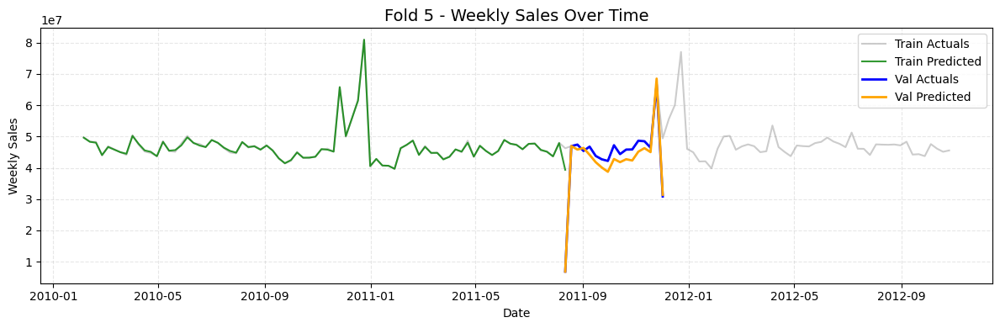


Fold 6 Scores:
Train RMSE: 3945.54 | Train WMAE: 2230.70
Valid RMSE: 4891.48 | Valid WMAE: 2550.58


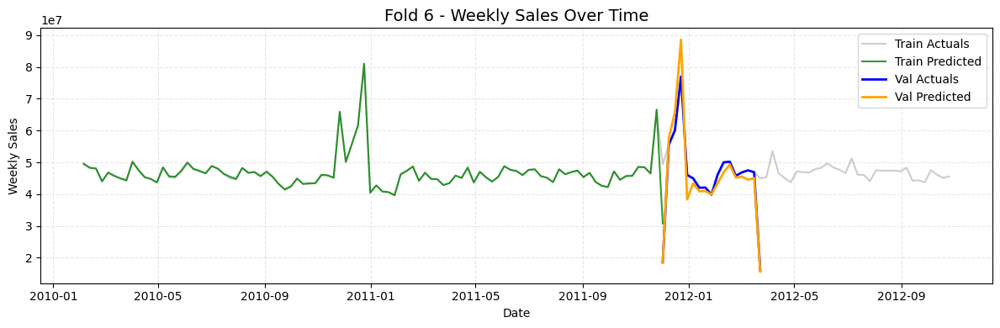


Fold 7 Scores:
Train RMSE: 3850.60 | Train WMAE: 2132.76
Valid RMSE: 4420.33 | Valid WMAE: 1961.09


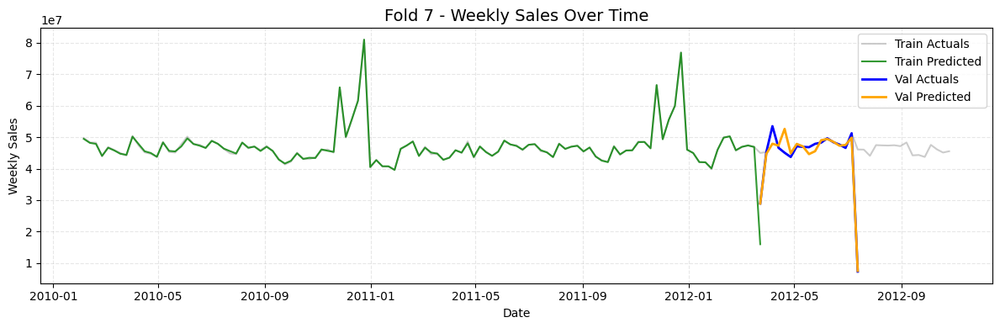


Fold 8 Scores:
Train RMSE: 3846.16 | Train WMAE: 2136.89
Valid RMSE: 3420.91 | Valid WMAE: 1692.89


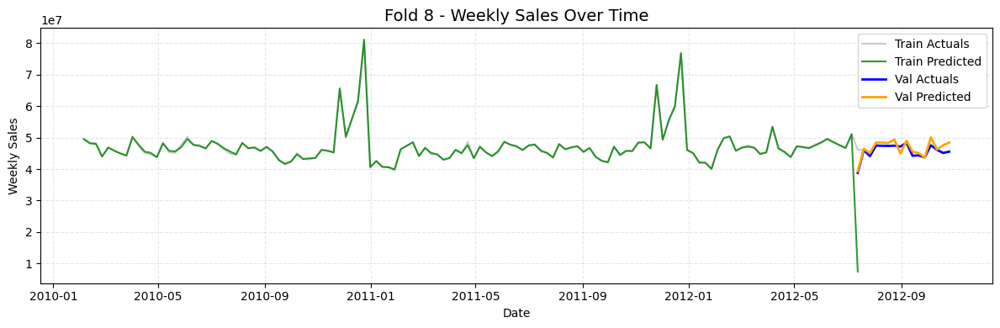


Mean Train RMSE: 3896.98
Mean Train WMAE: 2203.56
Mean Valid RMSE: 4450.10
Mean Valid WMAE: 2177.09


In [19]:
model = XGBRegressor(
    n_estimators=300,
    min_child_weight=10,
    learning_rate=0.1,
    max_depth=7,
    n_jobs=-1,
    random_state=42
)

pipeline = Pipeline([
    ('feature_engineer', feature_engineer),
    ('preprocessor', preprocessor),
    ('feature selection', feature_selection),
    ('model', model)
])

res = cross_validation(pipeline, X, y, df)


Fold 5 Scores:
Train RMSE: 3390.85 | Train WMAE: 1993.92
Valid RMSE: 4998.29 | Valid WMAE: 2501.19


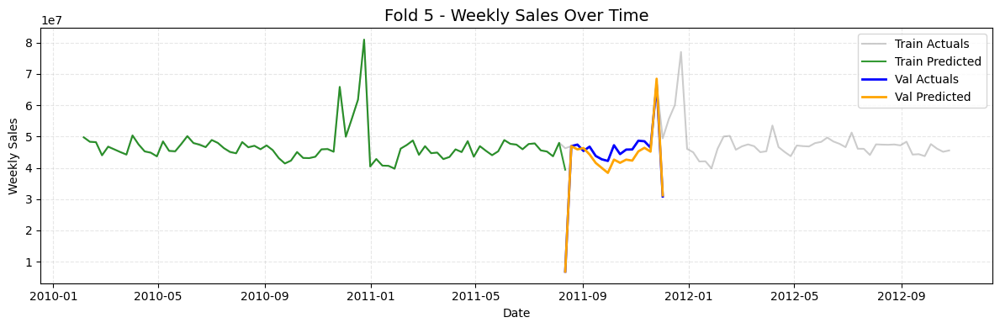


Fold 6 Scores:
Train RMSE: 3433.44 | Train WMAE: 1961.55
Valid RMSE: 4976.93 | Valid WMAE: 2555.43


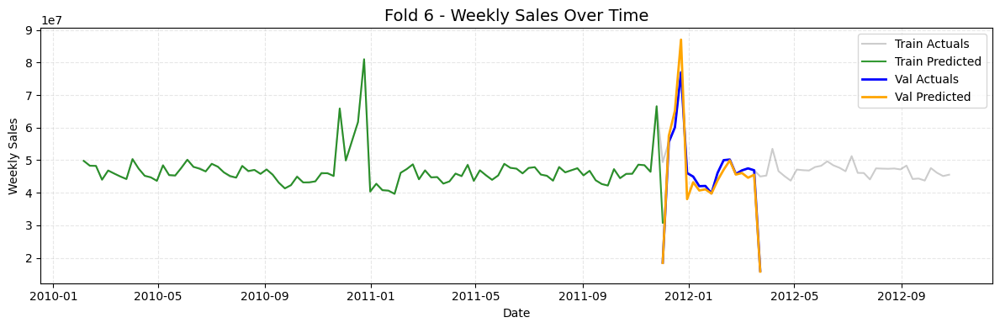


Fold 7 Scores:
Train RMSE: 3324.47 | Train WMAE: 1877.85
Valid RMSE: 4411.25 | Valid WMAE: 1939.97


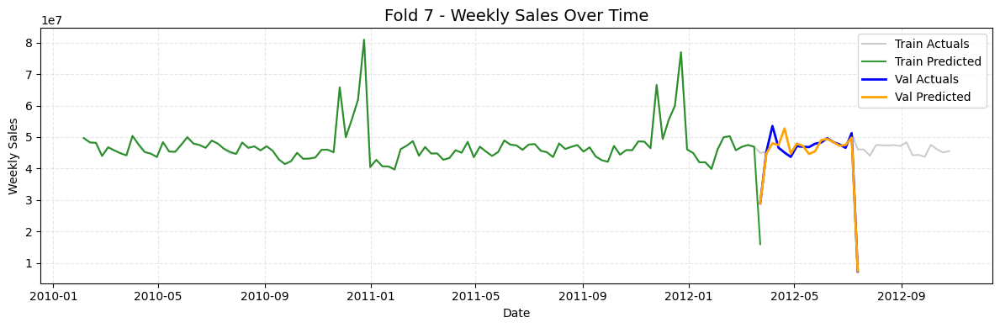


Fold 8 Scores:
Train RMSE: 3372.46 | Train WMAE: 1894.84
Valid RMSE: 3387.30 | Valid WMAE: 1673.06


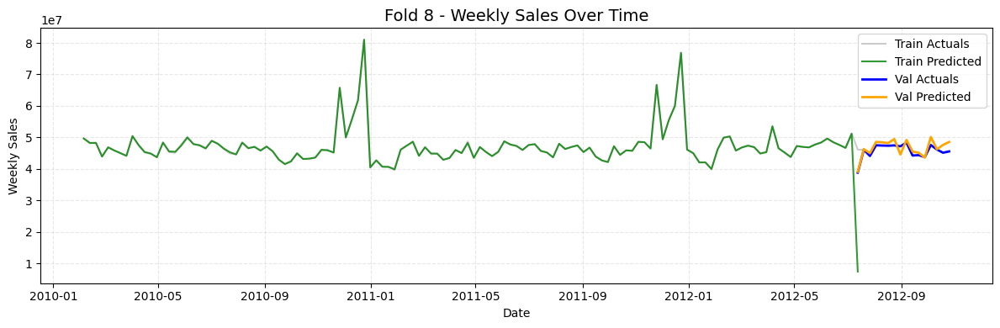


Mean Train RMSE: 3380.31
Mean Train WMAE: 1932.04
Mean Valid RMSE: 4443.44
Mean Valid WMAE: 2167.41


In [17]:
model = XGBRegressor(
    n_estimators=500,
    min_child_weight=10,
    learning_rate=0.1,
    max_depth=7,
    n_jobs=-1,
    random_state=42
)

pipeline = Pipeline([
    ('feature_engineer', feature_engineer),
    ('preprocessor', preprocessor),
    ('feature selection', feature_selection),
    ('model', model)
])

res = cross_validation(pipeline, X, y, df)

In [20]:
pipeline.fit(X,y)

test_pred = pipeline.predict(test)
submission = test[['Store', 'Dept', 'Date']].copy()
submission['Id'] = submission['Store'].astype(str) + '_' + submission['Dept'].astype(str) + '_' + submission['Date'].astype(str)
submission['Weekly_Sales'] = test_pred
submission = submission[['Id', 'Weekly_Sales']]
submission.to_csv("submission.csv", index=False)